#Importar librerias

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
%cd "/content/drive/MyDrive/Colab Notebooks/TrabajoGrado/Code_new"

%run New_funtions.ipynb

Mounted at /content/drive
/content/drive/MyDrive/Colab Notebooks/TrabajoGrado/Code_new
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 556.5/556.5 kB 3.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 163.8/163.8 kB 15.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pythresh: filename=pythresh-0.3.6-py3-none-any.whl size=571461 sha256=870e63c7a36c45d585fb5d2a9bea87de8245bffbc1adfe8debb2a8e4aacd2cba
  Stored in directory: /root/.cache/pip/wheels/8c/f4/d8/d16041569521f279a34f52fd44522ae2dc62a43df579d610a0
  Created wheel for pyod: filename=pyod-2.0.1-py3-none-any.whl size=193267 sha256=ef284d745911cad9c221fff907d551fd73f0ba5c6fb725bab639e2bf41360833
  Stored in directory: /root/.cache/pip/wheels/94/75/88/b853cf33b0053b0a001dca55b74d515048b7656e736364eb57
Successfully built pythresh pyod
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 160.0/160.0 kB 1.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
!pip install vitaldb
import vitaldb
import ast
from sklearn.metrics import mutual_info_score
from statsmodels.tsa.stattools import grangercausalitytests
from statsmodels.tsa.stattools import ccovf

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.5/57.5 kB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 160.0/160.0 kB 3.3 MB/s eta 0:00:00


#Importar datos de Vitaldb

In [2]:
#%% Preparacion
df_cases = pd.read_csv("https://api.vitaldb.net/cases")  # clinical information
df_trks = pd.read_csv("https://api.vitaldb.net/trks")  # track list
df_labs = pd.read_csv('https://api.vitaldb.net/labs')  # laboratory results

In [3]:


#%% Inlusion & Exclusion criteria
caseids = list(
    set(df_trks.loc[df_trks['tname'] == 'BIS/EEG1_WAV', 'caseid']) &
    set(df_trks.loc[df_trks['tname'] == 'BIS/EEG2_WAV', 'caseid']) &
    #set(df_trks.loc[df_trks['tname'] == 'SNUADC/ECG_V5', 'caseid']) &
    set(df_trks.loc[df_trks['tname'] == 'SNUADC/ECG_II', 'caseid']) &
    set(df_trks.loc[df_trks['tname'] == 'BIS/BIS','caseid']) &
    set(df_cases.loc[df_cases['department'] == 'General surgery','caseid']) &  #Tipo de cirugia
    set(df_cases.loc[df_cases['ane_type'] == 'General','caseid'])&  # Tipo de anestesia
    set(df_cases.loc[df_cases['position'] == 'Supine','caseid']) & # Posición boca arriba
    set(df_cases.loc[df_cases['approach'] == 'Open','caseid']) & # Abordaje quirurgico: abierto
    set(df_cases.loc[((df_cases['age'])>19) & (df_cases['age']<71) ,'caseid'])& # Pacientes con rango de edad 20-70 años
    set(df_cases.loc[df_cases['bmi']<=24.9,'caseid'])& # pacientes con peso normal
    set(df_cases.loc[df_cases['preop_pft']=='Normal','caseid'])& #pacientes con funcion pulmonar normal

    (set(df_cases.loc[df_cases['asa'] == 1, 'caseid']) | set(df_cases.loc[df_cases['asa'] == 2, 'caseid']))&
    set(df_cases.loc[df_cases['preop_htn']==0,'caseid'])&
    set(df_cases.loc[df_cases['preop_dm']==0,'caseid'])&
    set(df_cases.loc[df_cases['preop_ecg']=='Normal Sinus Rhythm','caseid']) # pacientes ritmo normal
)



print(f'{len(caseids)} cases found')

651 cases found


In [4]:
exclude_ids = [6151, 2058,   36, 4220, 4230, 4235, 6350, 4321, 2288, 4349,  255,
       4446, 4532, 4571, 2536, 4586,  523, 2571,  588, 4171, 2143,  274,
       2329,  424, 2476, 2151, 4123, 4159, 4180, 4274, 2166,  169,  204,
       2264, 4331, 2314, 4373, 2365, 4421, 2410,  393, 2518, 4595, 2592,
       2598, 2607, 4693]

# Excluir los IDs de caseids usando comprehension de listas
caseids = [caseid for caseid in caseids if caseid not in exclude_ids]

In [ ]:
len(caseids)

604

In [10]:
np.array(caseids[0:100])

array([   2, 6147, 2052, 6155, 6176,   35, 2090, 4139,   48, 2101, 2110,
       6210,   71,   72, 2122, 2123, 6223, 6226,   91, 6236, 2147, 6243,
       4200, 2154,  107, 4206, 6254, 2167, 6262, 2177,  134, 2185, 4234,
       6284,  141, 4236, 2194, 2200,  156, 2211, 4259, 2217, 4267, 4269,
       6320, 4273, 2229,  184, 6333, 4289,  203, 4302, 2255, 6351,  214,
       2266, 2269, 6372,  235, 6381, 2286, 2289, 6384, 4341, 4345, 2299,
       4357, 4365,  271, 2322,  276,  278, 4371, 2331, 4382, 4384,  289,
        294, 4395,  310,  311, 4418, 4420,  326, 4431,  339, 4436, 4438,
        345,  348,  350, 2403, 2404, 4460, 2414, 2415, 4462,  386, 2459,
       2465])

In [5]:
np.array(caseids[100:200])

array([ 418,  420, 4519, 2477, 2478, 4528, 4529,  437,  443, 4542, 4543,
       4544,  449,  450, 4551,  456,  461,  465,  466,  467,  469, 4567,
        472, 2530,  483, 2538,  491, 4592, 4594,  500,  502, 2550,  516,
       2565,  526,  536, 4634,  542, 2593,  546, 4646, 4648,  554,  555,
       4653, 2613, 4661, 4666,  572,  573, 2642, 4692, 4704,  609,  610,
        612,  613,  615, 2663, 2666, 2669, 4722,  632, 2681,  639,  644,
        647, 4746,  651, 4747,  653, 4750, 2710,  668, 4776, 2733, 4782,
        687,  688, 2739, 2742, 4792,  697, 4793, 2748, 4796,  704, 2754,
       4804,  709, 4807,  712, 4809, 4815,  721, 2770,  733,  735, 2794,
       4844])

In [6]:
np.array(caseids[200:300])

array([4847,  754, 2805, 4853, 4854, 4855,  767, 2817, 4869, 4870, 2835,
       2838, 2841, 4891, 4892, 4893, 4895, 2862, 4914, 2867, 4919, 2872,
       2874, 2876,  829, 4934,  839,  850,  852, 4950, 2904,  862,  863,
        866,  872, 4968, 2926, 2929, 4977, 4980,  885,  889, 2941, 4994,
        903,  905, 2954,  909, 5005, 5007, 2960, 5013, 2969, 2971, 5024,
        931,  934,  945,  947, 2999,  955, 5054, 5058, 3013, 5065, 3023,
       3025, 5073, 5074,  982, 3035, 5083, 5092, 5095, 5096, 5102, 1013,
       5109, 5114, 5115, 3068, 1024, 5123, 1030, 5127, 1034, 3083, 3084,
       5136, 3094, 1048, 5147, 5149, 1054, 3106, 3107, 3113, 1066, 5161,
       1068])

In [7]:
np.array(caseids[300:400])

array([5165, 1071, 3123, 1076, 5171, 5185, 3140, 5188, 5191, 1099, 1101,
       1106, 5205, 1111, 5208, 3166, 1120, 3168, 3182, 3183, 1136, 5232,
       1140, 3190, 5238, 5240, 3196, 3199, 5248, 3201, 3202, 5251, 5257,
       5268, 1175, 1176, 3224, 5275, 5279, 3236, 3238, 1193, 1194, 3242,
       5289, 5291, 3251, 3259, 3260, 1213, 3261, 3271, 5320, 5321, 1230,
       5329, 1235, 5332, 5334, 1239, 3287, 1241, 3290, 5337, 3297, 1251,
       3306, 5354, 1260, 1262, 1266, 1270, 1271, 1272, 1273, 3326, 3327,
       5374, 5375, 5382, 1288, 1289, 5385, 5394, 1302, 1304, 1312, 1314,
       5413, 3368, 1322, 1323, 1326, 3376, 5429, 5430, 5433, 1339, 1344,
       5442])

In [8]:
np.array(caseids[400:500])

array([1348, 5444, 5447, 1356, 3407, 1373, 1380, 1385, 3435, 1391, 1393,
       1399, 3447, 1401, 3456, 3459, 3462, 5510, 3467, 3475, 3476, 5523,
       3482, 3485, 5538, 1443, 3491, 3507, 1460, 5557, 3510, 5560, 1465,
       5561, 1467, 5563, 5569, 5570, 1475, 3523, 5576, 5578, 5580, 3534,
       1491, 5588, 3542, 5592, 3547, 3554, 1517, 1521, 5619, 3572, 1531,
       3583, 3586, 1540, 1542, 5642, 5645, 1551, 3599, 5652, 3605, 5653,
       5655, 3615, 3617, 3621, 5673, 1579, 3627, 3632, 3634, 1587, 1588,
       3635, 5687, 5693, 1602, 1603, 3651, 1605, 3655, 3657, 1613, 5714,
       5715, 3679, 1634, 3682, 5736, 3694, 3700, 1654, 1661, 1670, 5766,
       3720])

In [13]:
np.array(caseids[400:423])

array([1348, 5444, 5447, 1356, 3407, 1373, 1380, 1385, 3435, 1391, 1393,
       1399, 3447, 1401, 3456, 3459, 3462, 5510, 3467, 3475, 3476, 5523,
       3482])

In [9]:
np.array(caseids[500:605])

array([5770, 5771, 3727, 5777, 3731, 3733, 3734, 5785, 5791, 5797, 3756,
       5804, 3759, 3764, 5813, 3767, 3773, 1726, 5824, 3781, 3783, 1736,
       3791, 1744, 5842, 3800, 5852, 3809, 1762, 3811, 5857, 5860, 3814,
       3815, 1769, 1772, 3820, 1775, 3826, 1779, 5885, 3840, 1799, 3847,
       1801, 1802, 3854, 3856, 1809, 1811, 1818, 5915, 5917, 1824, 3889,
       3890, 3895, 5943, 5952, 5955, 1860, 3921, 5972, 5979, 5980, 5983,
       5991, 5993, 1900, 5997, 3951, 1905, 6014, 1919, 3969, 6017, 1924,
       1927, 6030, 6036, 3996, 6050, 1958, 6054, 6073, 1980, 6089, 1994,
       4043, 4044, 1997, 2001, 4054, 2008, 6104, 4060, 2022, 2023, 6125,
       2032, 6137, 2044, 4094, 4095])

#Codigo para 60s

In [ ]:
startindex = 1
stopindex = 2

for caseid_indx in range(startindex, stopindex, 1):
        print('caseid_indx: ---------------------------------------------------------------')
        print(caseid_indx)

        Fs_eeg = 250
        Fs_ecg = 250
       # filename = str(caseids[caseid_indx]).zfill(4) + '.vital'

        vals = vitaldb.load_case(caseids[caseid_indx], ['BIS/EEG1_WAV', 'BIS/EEG2_WAV'], 1/Fs_eeg)
        vals2 = vitaldb.load_case(caseids[caseid_indx], ['SNUADC/ECG_II'], 1/Fs_ecg)

        td=df_trks.loc[df_trks['tname']=='BIS/BIS']
        link='https://api.vitaldb.net/'
        fila_deseada = td.loc[td['caseid'] == caseids[caseid_indx]].index.item()
        bis=pd.read_csv(link+td['tid'][fila_deseada])

        try:
            # Assigning signals
            signal_eeg1 = vals[:,0]
            signal_eeg2 = vals[:,1]
            signal_ecgII = vals2[:,0]
            time_bis=bis['Time'].tolist()
            BIS=bis['BIS/BIS'].tolist()
            cond = np.any(BIS)
            if len(BIS) == 0 or all(val == BIS[0] for val in BIS) or cond == False or np.size(BIS) == 0:
                continue

        except:
            continue


        Fs = Fs_eeg
        samp_rates  = [Fs, Fs, Fs]
        signals     = [signal_eeg1, signal_eeg2, signal_ecgII]
        det_segms   = [False, False, False]
        segm_time   = 5
        window_time = 60
        overlap = False
        labels_q_L, signal_0_ind, signal_1_ind, signal_2_ind = quality_multi_signal(samp_rates, signals, det_segms, segm_time, window_time,overlap)

        # Para todas las señales es el mismo ind_start_good y ind_end_good
        # Escojo solo el de la señal eeg1
        ind_start_good = signal_0_ind["ind_start_good_L0"]
        ind_end_good = signal_0_ind["ind_end_good_L0"]

        #Datos demograficos:
        filtered_data = df_cases.loc[df_cases['caseid'] == caseids[caseid_indx]][['caseid', 'casestart', 'caseend', 'anestart', 'aneend', 'opstart', 'opend', 'age', 'sex', 'height', 'weight', 'optype', 'dx']]

        data_list = []
        for indice in range(0,len(ind_end_good),1):
            #Tiempo del segmento - donde inicia y termina // para todas las señales es la misma
            tiempo_start=(ind_start_good[indice])*(1/Fs)
            tiempo_end=(ind_end_good[indice])*(1/Fs)
            t=np.arange(tiempo_start,tiempo_end,1/Fs)

            #Segmentos EEG1
            signal_segm_eeg1=signal_eeg1[ind_start_good[indice]:ind_end_good[indice]]
            signal_segm_eeg1 = signal_segm_eeg1.astype(np.float64)
            signal_notch_eeg1 = notch_filter(signal_segm_eeg1)
            signal_golay_eeg1 = golay_filter(signal_notch_eeg1,'bior3.3', 2)

            #Segmentos EEG2
            signal_segm_eeg2=signal_eeg2[ind_start_good[indice]:ind_end_good[indice]]
            signal_segm_eeg2 = signal_segm_eeg2.astype(np.float64)
            signal_notch_eeg2 = notch_filter(signal_segm_eeg2)
            signal_golay_eeg2 = golay_filter(signal_notch_eeg2,'bior3.3', 2)

            #Segmentos ECGII
            signal_segm_ecgII=signal_ecgII[ind_start_good[indice]:ind_end_good[indice]]
            signal_segm_ecgII = signal_segm_ecgII.astype(np.float64)
            signal_notch_ecgII = notch_filter(signal_segm_ecgII)
            signal_golay_ecgII = golay_filter(signal_notch_ecgII,'bior3.5', 2)
            seg_ecg_blw_2 = low_pass_filter(signal_golay_ecgII, 0.45)

            # filtro para detectar el complejo QRS
            seg_qrs_2 = bandpass(seg_ecg_blw_2)

            #Encontrar HRV
            try:
                #detect_bestAlgorithm
                best_algorithm_2,r_pks_2,r_pks_ms_2 = detect_bestAlgorithm(seg_qrs_2)
            except:
                continue

            rr_0 =np.diff(r_pks_ms_2)
            try:
                picos_olvidados = detect_picos_olvidados(rr_0)

                #if sum(valor == 1 for valor in picos_olvidados) > 2 or len(r_pks_2)<40 or len(r_pks_2)>100:
                if len(r_pks_2)<40:
                    continue

                nn_2=correction_outliers(r_pks_2,len(r_pks_2),t, 5.2)

            except:
              continue

            #Encontrar segmentos de cada paciente de la señal BIS
            #Interpolar valores nan y ceros
            bis_inter = interpolacion_bis(BIS)
            #interpolar para obtener señal del mismo tamaño
            fcubic = interpolate.interp1d(time_bis, bis_inter, kind='cubic')
            tnew = np.arange(time_bis[0], time_bis[-1], 1/250)
            if tnew[-1] > np.max(time_bis):
                tnew[-1] = np.max(time_bis)
            ycubic = fcubic(tnew)
            tiempo_start_bis=int(tiempo_start)
            tiempo_end_bis=int(tiempo_end)

            muestra_start=(tiempo_start_bis*Fs)
            muestra_end=tiempo_end_bis*Fs
            seg_bis=ycubic[muestra_start:muestra_end]

            #Definir estados de anestesia
            estados = [1] * len(ind_start_good)
            mean_bis_seg = np.mean(seg_bis)

            if 80 <= mean_bis_seg <= 100:
              estados[indice] = 0
            elif 60 <= mean_bis_seg <= 80:
              estados[indice] = 1
            elif 40 <= mean_bis_seg <= 60:
              estados[indice] = 2
            elif 20 <= mean_bis_seg <= 40:
              estados[indice] = 3
            elif 0 <= mean_bis_seg <= 20:
              estados[indice] = 4



            # Encontrar outliers e interpolar nn
            nn_2 =nn_2*1000
            val_beats2 =cambio_porcentaje_nn(nn_2)
            nn_inter2 = interpolacion_final(val_beats2,nn_2)

            if len(nn_inter2) == 0 or np.all(nn_inter2 == nn_inter2[0]):
                continue


            #Descomponer señal EEG en diferentes bandas de frecuencia
            eeg1_lenta = band_pass(signal_golay_eeg1,0.1,1,250)
            eeg1_delta = band_pass(signal_golay_eeg1,1,4,250)
            eeg1_theta = band_pass(signal_golay_eeg1,5,8,250)
            eeg1_alpha = band_pass(signal_golay_eeg1,9,12,250)
            eeg1_beta = band_pass(signal_golay_eeg1,13,25,250)
            eeg1_gamma = band_pass(signal_golay_eeg1,26,80,250)

            eeg2_lenta = band_pass(signal_golay_eeg2,0.1,1,250)
            eeg2_delta = band_pass(signal_golay_eeg2,1,4,250)
            eeg2_theta = band_pass(signal_golay_eeg2,5,8,250)
            eeg2_alpha = band_pass(signal_golay_eeg2,9,12,250)
            eeg2_beta = band_pass(signal_golay_eeg2,13,25,250)
            eeg2_gamma = band_pass(signal_golay_eeg2,26,80,250)

            #Descomponer señal ECG en diferentes bandas de frecuencia
            ecg2_lenta = band_pass(seg_ecg_blw_2,0.1,1,250)
            ecg2_delta = band_pass(seg_ecg_blw_2,1,4,250)
            ecg2_theta = band_pass(seg_ecg_blw_2,5,8,250)
            ecg2_alpha = band_pass(seg_ecg_blw_2,9,12,250)
            ecg2_beta = band_pass(seg_ecg_blw_2,13,25,250)
            ecg2_gamma = band_pass(seg_ecg_blw_2,26,80,250)



            tacograma_hf = band_pass(inter_tacograma(nn_inter2),0.15,0.4,4)
            tacograma_lf = band_pass(inter_tacograma(nn_inter2),0.04,0.15,4)
            #tacograma_vlf = band_pass(inter_tacograma(nn_inter2),0.003,0.04,50)

            inter_hrv = inter_tacograma(nn_inter2)


            current_data_dict = filtered_data.iloc[0].to_dict()

            # Agregar más claves al diccionario si es necesario
            current_data_dict.update({
                'Estado': estados[indice],
                'tiempo': t,
                'seg_bis': seg_bis,
                'EEG1':signal_golay_eeg1,
                'EEG2':signal_golay_eeg2,
                'ECG':seg_ecg_blw_2,
                'HRV': inter_hrv,
                'r_pks_2':r_pks_2,
                'eeg1_lenta':eeg1_lenta,
                'eeg1_delta': eeg1_delta,
                'eeg1_theta': eeg1_theta,
                'eeg1_alpha':eeg1_alpha ,
                'eeg1_beta': eeg1_beta,
                'eeg1_gamma': eeg1_gamma,
                'eeg2_lenta':eeg2_lenta,
                'eeg2_delta': eeg2_delta,
                'eeg2_theta': eeg2_theta,
                'eeg2_alpha':eeg2_alpha ,
                'eeg2_beta' :eeg2_beta,
                'eeg2_gamma': eeg2_gamma,
                'ecg2_lenta':ecg2_lenta,
                'ecg2_delta': ecg2_delta,
                'ecg2_theta': ecg2_theta,
                'ecg2_alpha':ecg2_alpha ,
                'ecg2_beta': ecg2_beta,
                'ecg2_gamma': ecg2_gamma,
                'tacograma_hf' :tacograma_hf,
                'tacograma_lf': tacograma_lf
            })

            # Agregar el diccionario a la lista
            data_list.append(current_data_dict)


caseid_indx: ---------------------------------------------------------------
1


In [ ]:
df = pd.DataFrame(data_list)
df

,caseid,casestart,caseend,anestart,aneend,opstart,opend,age,sex,height,...,eeg2_beta,eeg2_gamma,ecg2_lenta,ecg2_delta,ecg2_theta,ecg2_alpha,ecg2_beta,ecg2_gamma,tacograma_hf,tacograma_lf
0,6147,0,18554,428,18008.0,2408,17708,26.0,F,157.1,...,"[-2.1677871530964695e-06, 0.05645960846825015,...","[-5.655198531684391e-16, -0.08825582347005616,...","[-0.031413262021128645, -0.035587275579903065,...","[0.010967843675662663, 0.018116652873339505, 0...","[0.0030567256853839073, 0.01850064600302206, 0...","[0.0019780619627630057, -0.008528374885253941,...","[6.857152437315132e-06, -0.0007986301409990311...","[1.0787811616230769e-17, -0.002293972102323774...","[-0.001873148404146742, 10.127676709186678, 18...","[0.5517129719849664, 4.253236906602456, 7.6894..."
1,6147,0,18554,428,18008.0,2408,17708,26.0,F,157.1,...,"[4.567843511667604e-06, 0.08934041030347879, 0...","[1.938553484404082e-16, -0.034673845311920734,...","[0.1623121074245433, 0.1643979975380225, 0.166...","[-0.03379028823678625, -0.03573967784053684, -...","[0.00037234783140567524, -0.005563053944766793...","[-0.00020696151942932217, 0.000996713759123027...","[-1.440157028272414e-07, -0.000434555952484737...","[4.694595406862234e-17, -0.001402503399062444,...","[-0.00019600327903546155, -24.0071585541814, -...","[-0.20833342040199107, 6.357048326533212, 12.9..."
2,6147,0,18554,428,18008.0,2408,17708,26.0,F,157.1,...,"[-1.0381726940820535e-05, 0.039333731554780454...","[2.3666778172642955e-16, -0.007067221080805344...","[-0.051962082157047874, -0.04887765937826347, ...","[-0.005856486537674866, -0.011907342948315166,...","[-0.0014711906260215124, 0.0321955527668178, 0...","[-0.00043355371829514313, -0.01247437698727497...","[4.241443083669949e-07, -0.008744780419652612,...","[6.667843360785852e-18, -0.0003044341461270662...","[0.0022445239664232383, -31.362123637328867, -...","[-0.658241564550904, 4.431215332372894, 9.4575..."
3,6147,0,18554,428,18008.0,2408,17708,26.0,F,157.1,...,"[-8.59900265809296e-06, -0.03518732757605026, ...","[-1.6740081543176188e-16, 0.026522274808515642...","[-0.049962270599961355, -0.046796553427374384,...","[-0.004830062267600402, -0.012767640413056006,...","[-0.0007701060060314148, 0.03345114725759711, ...","[-0.0005474180150375836, -0.01721612443776676,...","[-2.1750507746702064e-07, -0.00671998369140207...","[-7.589415207398531e-19, -0.000735497433300571...","[-0.001224987853753079, 11.304980018117297, 21...","[0.19221887769409604, -6.3480249095886165, -12..."
4,6147,0,18554,428,18008.0,2408,17708,26.0,F,157.1,...,"[6.482935143844884e-06, 0.12605201958737083, 0...","[-3.608224830031759e-16, -0.0565326610178634, ...","[-0.06933136835197286, -0.06991069696550196, -...","[0.01067986343188253, 0.017872147841428435, 0....","[-0.0023764052244784756, 0.004296534667124859,...","[-0.0025845764991423966, -0.005867206706980111...","[2.4466135686440835e-06, 0.0009873891907496441...","[5.366800753803247e-18, 0.0008520579532910483,...","[-0.001792761321726788, 6.192370838506959, 12....","[0.9243228897080111, 3.3143568374692447, 5.391..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
178,6147,0,18554,428,18008.0,2408,17708,26.0,F,157.1,...,"[-0.0004297673302325394, 1.0214872616612525, 1...","[-1.1268763699945339e-14, -0.09698955174811956...","[-0.012548960245212726, -0.01188278322590606, ...","[0.008803269083151419, 0.008753612954720524, 0...","[0.0008854986268986782, -0.005627731689812707,...","[-0.0002971604799354389, -0.007881827371182032...","[7.747159724247492e-08, -0.0012020749003194887...","[-7.413232354369637e-18, -0.000774595651801600...","[5.847725767911538e-05, 7.018479025950728, 13....","[0.0895416297901454, 3.009744457296163, 5.8522..."
179,6147,0,18554,428,18008.0,2408,17708,26.0,F,157.1,...,"[0.00029318787108341404, -0.0712345059712, -0....","[5.616167253474913e-15, -0.08220554991288616, ...","[0.12173722587946031, 0.12372039744356603, 0.1...","[-0.021560793523616863, -0.023124015596175534,...","[-0.001

#Cargar dataframe de paciente y caracteristicas

In [ ]:
df_caract =pd.read_csv('/content/drive/MyDrive/Colab Notebooks/TrabajoGrado/Code_new/SerieTemporales/Dataframes2/df_caract_clean.csv')
df_caract

,bis_max,bis_min,bis_med,bis_median,bis_mod,bis_var,bis_std,hr_max,hr_min,hr_med,...,anestart,aneend,opstart,opend,age,sex,height,weight,optype,dx
0,0.190082,0.171052,0.177545,0.176628,0.159618,0.005436,0.073726,0.032624,0.158434,0.066708,...,-1039.0,14921.0,1721.0,14621.0,54.0,M,167.3,54.80,Stomach,Advanced gastric cancer
1,0.272461,0.274630,0.272785,0.271592,0.264625,0.000409,0.020227,0.038021,0.176606,0.076985,...,-1039.0,14921.0,1721.0,14621.0,54.0,M,167.3,54.80,Stomach,Advanced gastric cancer
2,0.281533,0.255472,0.266719,0.262256,0.245203,0.011775,0.108511,0.037082,0.175240,0.075250,...,-1039.0,14921.0,1721.0,14621.0,54.0,M,167.3,54.80,Stomach,Advanced gastric cancer
3,0.257664,0.235360,0.236030,0.229487,0.224814,0.009546,0.097702,0.034806,0.177983,0.075180,...,-1039.0,14921.0,1721.0,14621.0,54.0,M,167.3,54.80,Stomach,Advanced gastric cancer
4,0.189475,0.177850,0.183907,0.185197,0.166510,0.004746,0.068890,0.038976,0.195426,0.084837,...,-1039.0,14921.0,1721.0,14621.0,54.0,M,167.3,54.80,Stomach,Advanced gastric cancer
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39361,0.216217,0.216232,0.212822,0.210575,0.205422,0.001031,0.032107,0.046166,0.203234,0.092098,...,-694.0,5006.0,806.0,4106.0,45.0,F,159.8,53.35,Breast,Infiltrating ductal carcinoma of breast right
39362,0.212184,0.212675,0.210337,0.208193,0.201815,0.000555,0.023568,0.054374,0.195426,0.095698,...,-694.0,5006.0,806.0,4106.0,45.0,F,159.8,53.35,Breast,Infiltrating ductal carcinoma of breast right
39363,0.213693,0.215969,0.212891,0.210508,0.205155,0.000495,0.022241,0.047272,0.203234,0.093681,...,-694.0,5006.0,806.0,4106.0,45.0,F,159.8,53.35,Breast,Infiltrating ductal carcinoma of breast right
39364,0.287023,0.297734,0.289903,0.287889,0.288048,0.000000,0.000000,0.076567,0.300134,0.155733,...,-694.0,5006.0,806.0,4106.0,45.0,F,159.8,53.35,Breast,Infiltrating ductal carcinoma of breast right


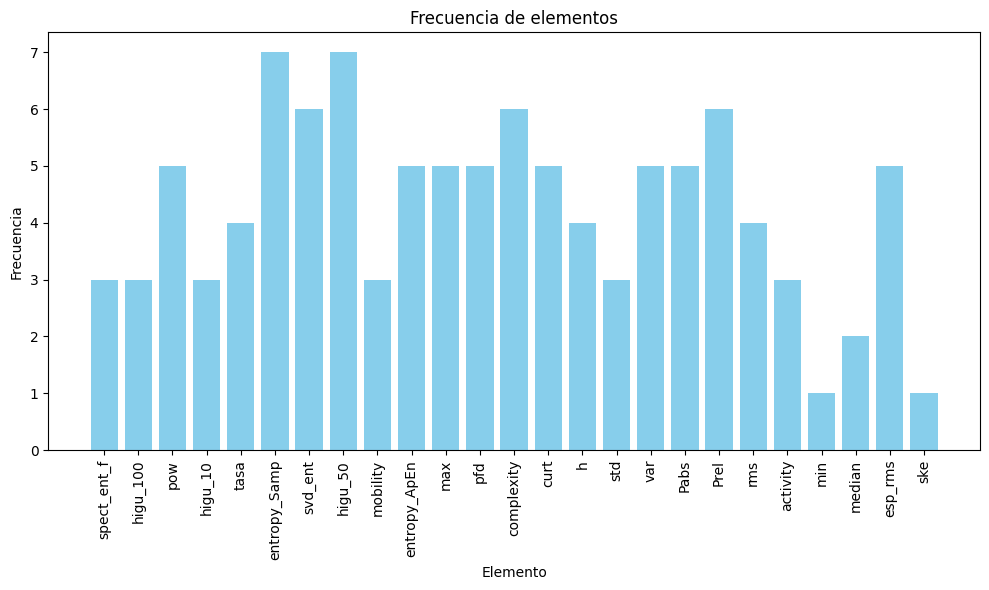

In [ ]:
from collections import Counter

# Lista de elementos
lista = [
    "spect_ent_f", "higu_100", "pow", "higu_10", "tasa", "entropy_Samp", "svd_ent", "higu_50", "mobility",
    "entropy_ApEn", "max", "pfd", "complexity", "curt", "h", "std", "var", "pow", "Pabs", "higu_100", "pfd",
    "higu_50", "Prel", "max", "rms", "svd_ent", "activity", "entropy_Samp", "min", "median", "std", "pow", "var",
    "Pabs", "Prel", "rms", "median", "activity", "higu_50", "max", "entropy_Samp", "complexity", "esp_rms", "ske",
    "curt", "Pabs", "esp_rms", "entropy_ApEn", "Prel", "complexity", "curt", "entropy_Samp", "h", "rms", "max",
    "var", "activity", "pow", "higu_50", "svd_ent", "Pabs", "higu_10", "pfd", "tasa", "esp_rms", "h", "spect_ent_f",
    "entropy_Samp", "higu_50", "pow", "var", "entropy_ApEn", "complexity", "Prel", "svd_ent", "tasa", "entropy_Samp",
    "entropy_ApEn", "mobility", "higu_10", "svd_ent", "higu_50", "esp_rms", "Prel", "pfd", "max", "higu_100",
    "complexity", "h", "curt", "spect_ent_f", "pfd", "tasa", "mobility", "svd_ent", "complexity", "entropy_ApEn",
    "std", "rms", "entropy_Samp", "esp_rms", "Pabs", "var", "curt", "higu_50", "Prel"
]

# Contar la frecuencia de cada elemento
frecuencia = Counter(lista)

# Extraer elementos y frecuencias
elementos = list(frecuencia.keys())
frecuencias = list(frecuencia.values())

# Crear el gráfico de barras
plt.figure(figsize=(10, 6))
plt.bar(elementos, frecuencias, color='skyblue')
plt.xlabel('Elemento')
plt.ylabel('Frecuencia')
plt.title('Frecuencia de elementos')
plt.xticks(rotation=90)  # Rotar etiquetas del eje x para mejor visualización
plt.tight_layout()
plt.show()

In [ ]:
# Calcular el número de estados diferentes por paciente
estados_por_paciente = df_caract.groupby('caseid')['Estado'].nunique()

print("Número de estados diferentes por paciente:")
print(estados_por_paciente)

Número de estados diferentes por paciente:
caseid
2.0       4
35.0      3
36.0      2
48.0      3
71.0      1
         ..
6284.0    4
6320.0    3
6333.0    3
6351.0    4
6372.0    4
Name: Estado, Length: 415, dtype: int64


In [ ]:
# Filtrar los pacientes que solo tienen 4 estados diferentes
pacientes_con_4_estados = estados_por_paciente[estados_por_paciente == 4]

# Obtener los IDs de los pacientes que cumplen con el criterio
ids_pacientes_con_4_estados = pacientes_con_4_estados.index.tolist()

# Filtrar el DataFrame original para obtener los datos de los pacientes seleccionados
pacientes_seleccionados = df_caract[df_caract['caseid'].isin(ids_pacientes_con_4_estados)]

# Ahora pacientes_seleccionados contiene solo los pacientes que tienen exactamente 4 estados diferentes


In [ ]:
pacientes_seleccionados

,bis_max,bis_min,bis_med,bis_median,bis_mod,bis_var,bis_std,hr_max,hr_min,hr_med,...,anestart,aneend,opstart,opend,age,sex,height,weight,optype,dx
0,0.190082,0.171052,0.177545,0.176628,0.159618,0.005436,0.073726,0.032624,0.158434,0.066708,...,-1039.0,14921.0,1721.0,14621.0,54.0,M,167.3,54.80,Stomach,Advanced gastric cancer
1,0.272461,0.274630,0.272785,0.271592,0.264625,0.000409,0.020227,0.038021,0.176606,0.076985,...,-1039.0,14921.0,1721.0,14621.0,54.0,M,167.3,54.80,Stomach,Advanced gastric cancer
2,0.281533,0.255472,0.266719,0.262256,0.245203,0.011775,0.108511,0.037082,0.175240,0.075250,...,-1039.0,14921.0,1721.0,14621.0,54.0,M,167.3,54.80,Stomach,Advanced gastric cancer
3,0.257664,0.235360,0.236030,0.229487,0.224814,0.009546,0.097702,0.034806,0.177983,0.075180,...,-1039.0,14921.0,1721.0,14621.0,54.0,M,167.3,54.80,Stomach,Advanced gastric cancer
4,0.189475,0.177850,0.183907,0.185197,0.166510,0.004746,0.068890,0.038976,0.195426,0.084837,...,-1039.0,14921.0,1721.0,14621.0,54.0,M,167.3,54.80,Stomach,Advanced gastric cancer
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39014,0.178040,0.146620,0.158420,0.153084,0.134849,0.012713,0.112754,0.025842,0.137751,0.052825,...,-317.0,9403.0,1003.0,8503.0,63.0,F,150.2,52.85,Breast,Breast cancer unspecified side
39015,0.224737,0.185465,0.213224,0.216503,0.174231,0.015192,0.123258,0.023303,0.130410,0.050224,...,-317.0,9403.0,1003.0,8503.0,63.0,F,150.2,52.85,Breast,Breast cancer unspecified side
39016,0.342448,0.352387,0.345127,0.343266,0.343456,0.000000,0.000002,0.071516,0.193905,0.110758,...,-317.0,9403.0,1003.0,8503.0,63.0,F,150.2,52.85,Breast,Breast cancer unspecified side
39017,0.349766,0.278208,0.284800,0.275420,0.275572,0.037698,0.194161,0.069909,0.200070,0.114597,...,-317.0,9403.0,1003.0,8503.0,63.0,F,150.2,52.85,Breast,Breast cancer unspecified side


In [ ]:

df_paciente = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/TrabajoGrado/Code_new/SerieTemporales/Dataframes2/df_paciente1.csv',
                          converters={'tiempo': ast.literal_eval, 'seg_bis': ast.literal_eval,'EEG1':ast.literal_eval,'EEG2':ast.literal_eval,
                                      'ECG':ast.literal_eval,'HRV': ast.literal_eval,'eeg1_lenta':ast.literal_eval,'eeg1_delta': ast.literal_eval,
                                      'eeg1_theta': ast.literal_eval,'eeg1_alpha':ast.literal_eval ,'eeg1_beta': ast.literal_eval,'eeg1_gamma': ast.literal_eval,
                                      'eeg2_lenta':ast.literal_eval,'eeg2_delta': ast.literal_eval,'eeg2_theta': ast.literal_eval,'eeg2_alpha':ast.literal_eval ,
                                      'eeg2_beta' :ast.literal_eval,'eeg2_gamma': ast.literal_eval,'ecg2_lenta':ast.literal_eval,'ecg2_delta': ast.literal_eval,
                                      'ecg2_theta': ast.literal_eval,'ecg2_alpha':ast.literal_eval ,'ecg2_beta': ast.literal_eval,'ecg2_gamma': ast.literal_eval,
                                      'tacograma_hf' :ast.literal_eval,'tacograma_lf': ast.literal_eval})
df_paciente

SyntaxError: invalid syntax (<unknown>, line 1)

# Dividir los pacientes de acuerdo al anestesico

In [ ]:
nombres_tname = ['BIS/BIS','Orchestra/PPF20_CE','Orchestra/PPF20_CP','Orchestra/PPF20_CT',
 'Orchestra/PPF20_RATE','Orchestra/PPF20_VOL','Orchestra/RFTN20_CE','Orchestra/RFTN20_CP','Orchestra/RFTN20_CT','Orchestra/RFTN20_RATE',
 'Orchestra/RFTN20_VOL','Primus/EXP_SEVO','Primus/EXP_DES','Primus/INSP_SEVO', 'Primus/INSP_DES', 'Primus/FEN2O','Primus/FIN2O']
link = 'https://api.vitaldb.net/'

cases2 = caseids
resultados = {'con_datos': [], 'con_error': [], 'con_ceros': []}


for cases in cases2:
    for nombre_tname in nombres_tname:
        td = df_trks.loc[df_trks['tname'] == nombre_tname]
        # Filtrar el DataFrame td por 'caseid' y seleccionar todos los resultados
        filas_deseadas = td.loc[td['caseid'] == case]

    # Verificar si se encontraron filas
        if not filas_deseadas.empty:

            for idx, fila in filas_deseadas.iterrows():
                anes_data = pd.read_csv(link + fila['tid'])

                non_time_cols = anes_data.columns[anes_data.columns != nombre_tname]
                any_non_zero = (anes_data[non_time_cols] != 0).any(axis=1).any()
                all_zeros = (anes_data[non_time_cols] == 0).all().all()
                time_all_zeros = (anes_data[nombre_tname] == 0).all()

                if any_non_zero and (all_zeros or time_all_zeros):
                    resultados['con_ceros'].append((case, nombre_tname))
                else:
                    resultados['con_datos'].append((case, nombre_tname))

        else:
            resultados['con_error'].append((case,nombre_tname))


In [ ]:
data = resultados['con_datos']

# Crear conjuntos para pacientes de Orchestra y Primus
pacientes_orchestra = set()
pacientes_primus = set()

# Recorrer la lista de datos nuevamente y categorizar a los pacientes
for paciente_numero, nombre in data:
    if 'Orchestra' in nombre:
        pacientes_orchestra.add(paciente_numero)
    if 'Primus' in nombre:
        pacientes_primus.add(paciente_numero)

# Calcular el número de pacientes en cada categoría
pacientes_orchestra_solo = len(pacientes_orchestra - pacientes_primus)
pacientes_primus_solo = len(pacientes_primus - pacientes_orchestra)
pacientes_ambos = len(pacientes_orchestra.intersection(pacientes_primus))


lista_pacientes_orchestra = list(pacientes_orchestra - pacientes_primus)
lista_pacientes_primus = list(pacientes_primus - pacientes_orchestra)
lista_pacientes_en_ambos = list(pacientes_orchestra.intersection(pacientes_primus))

print("Número de pacientes en la categoría 'Orchestra' solamente:", pacientes_orchestra_solo)
print("Número de pacientes en la categoría 'Primus' solamente:", pacientes_primus_solo)
print("Número de pacientes en ambas categorías ('Orchestra' y 'Primus'):", pacientes_ambos)

print("lista de pacientes con orchestra:", lista_pacientes_orchestra)
print("lista de pacientes con primus:", lista_pacientes_primus)
print("lista de pacientes con ambos:", lista_pacientes_en_ambos)

Número de pacientes en la categoría 'Orchestra' solamente: 161
Número de pacientes en la categoría 'Primus' solamente: 23
Número de pacientes en ambas categorías ('Orchestra' y 'Primus'): 50
lista de pacientes con orchestra: [5123, 2565, 2058, 6155, 5645, 1551, 4123, 1054, 542, 3617, 35, 36, 1066, 4139, 1068, 48, 1588, 5687, 572, 5185, 1603, 5188, 3657, 2122, 2123, 588, 1101, 1613, 6223, 5205, 1111, 5208, 3166, 1120, 609, 6243, 615, 5736, 2154, 2666, 6254, 3182, 1136, 4220, 4230, 3720, 4234, 4747, 141, 5777, 3733, 3734, 668, 5791, 4259, 3236, 3238, 2217, 3242, 4267, 5804, 3759, 3764, 2229, 4793, 1213, 3261, 712, 1736, 1230, 3791, 5329, 1235, 5332, 214, 5334, 3287, 5337, 5852, 5857, 1762, 3811, 1769, 2794, 1260, 3820, 2286, 2288, 2289, 1270, 5375, 1289, 3856, 1809, 4371, 276, 4373, 5915, 4895, 1824, 5412, 5413, 4395, 3376, 5430, 5433, 4418, 1348, 5444, 850, 345, 5979, 350, 5991, 872, 2410, 2414, 3951, 1393, 885, 889, 2941, 6014, 1919, 4994, 1924, 5510, 3467, 6030, 3475, 3482, 2971, 2465

In [ ]:
df_cases


,caseid,subjectid,casestart,caseend,anestart,aneend,opstart,opend,adm,dis,...,intraop_colloid,intraop_ppf,intraop_mdz,intraop_ftn,intraop_rocu,intraop_vecu,intraop_eph,intraop_phe,intraop_epi,intraop_ca
0,1,5955,0,11542,-552,10848.0,1668,10368,-236220,627780,...,0,120,0.0,100,70,0,10,0,0,0
1,2,2487,0,15741,-1039,14921.0,1721,14621,-221160,1506840,...,0,150,0.0,0,100,0,20,0,0,0
2,3,2861,0,4394,-590,4210.0,1090,3010,-218640,40560,...,0,0,0.0,0,50,0,0,0,0,0
3,4,1903,0,20990,-778,20222.0,2522,17822,-201120,576480,...,0,80,0.0,100,100,0,50,0,0,0
4,5,4416,0,21531,-1009,22391.0,2591,20291,-67560,3734040,...,0,0,0.0,0,160,0,10,900,0,2100
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6383,6384,5583,0,15248,-260,15640.0,2140,14140,-215340,648660,...,0,150,0.0,0,90,0,20,0,0,0
6384,6385,2278,0,20643,-544,20996.0,2396,19496,-225600,1675200,...,0,100,0.0,0,100,0,25,30,0,300
6385,6386,4045,0,19451,-667,19133.0,3533,18233,-200460,836340,...,0,70,0.0,0,130,0,10,0,0,0
6386,6387,5230,0,12025,-550,12830.0,1730,11030,-227760,377040,...,0,120,0.0,0,50,0,0,0,0,0


In [ ]:
i = 4481
valor_bolofentanilo=df_cases.loc[df_cases['caseid']==i]['intraop_ftn'][i-1]
valor_bolopropofol=df_cases.loc[df_cases['caseid']==i]['intraop_ppf'][i-1]

In [ ]:
valor_bolofentanilo


0

In [ ]:
valor_bolopropofol

0

In [ ]:
data[2][0]

4481

In [ ]:
if data[]

In [ ]:
from itertools import combinations
from collections import defaultdict

# Lista de tuplas donde cada tupla representa (paciente, medicamento)



# Crear un diccionario para almacenar las combinaciones de medicamentos para cada paciente
combinations_dict = defaultdict(list)

# Llenar el diccionario con las combinaciones de medicamentos
for paciente, medicamento in data:
    combinations_dict[paciente].append(medicamento)

# Crear una lista de tuplas que contenga (combinación de medicamentos, paciente)
combinations_list = [(tuple(sorted(meds)), paciente) for paciente, meds in combinations_dict.items()]

# Crear un diccionario para contar el número de pacientes por combinación de medicamentos
count_dict = defaultdict(int)

# Contar el número de pacientes por combinación de medicamentos
for _, paciente in combinations_list:
    count_dict[_] += 1

# Imprimir el resultado
for combination, count in count_dict.items():
    print(f'Combinación: {combination}, Número de pacientes: {count}')






Combinación: ('BIS/BIS', 'Orchestra/PPF20_CE', 'Orchestra/PPF20_CP', 'Orchestra/PPF20_CT', 'Orchestra/PPF20_RATE', 'Orchestra/PPF20_VOL', 'Orchestra/RFTN20_CE', 'Orchestra/RFTN20_CP', 'Orchestra/RFTN20_CT', 'Orchestra/RFTN20_RATE', 'Orchestra/RFTN20_VOL'), Número de pacientes: 159
Combinación: ('BIS/BIS', 'Primus/EXP_DES', 'Primus/EXP_SEVO', 'Primus/INSP_DES', 'Primus/INSP_SEVO'), Número de pacientes: 5
Combinación: ('BIS/BIS', 'Orchestra/PPF20_CE', 'Orchestra/PPF20_CP', 'Orchestra/PPF20_CT', 'Orchestra/PPF20_RATE', 'Orchestra/PPF20_VOL', 'Orchestra/RFTN20_CE', 'Orchestra/RFTN20_CP', 'Orchestra/RFTN20_CT', 'Orchestra/RFTN20_RATE', 'Orchestra/RFTN20_VOL', 'Primus/EXP_SEVO', 'Primus/INSP_SEVO'), Número de pacientes: 10
Combinación: ('BIS/BIS', 'Orchestra/RFTN20_CE', 'Orchestra/RFTN20_CP', 'Orchestra/RFTN20_CT', 'Orchestra/RFTN20_RATE', 'Orchestra/RFTN20_VOL', 'Primus/EXP_SEVO', 'Primus/INSP_SEVO'), Número de pacientes: 6
Combinación: ('BIS/BIS', 'Orchestra/PPF20_CE', 'Orchestra/PPF20_CP'

In [ ]:




# Crear un diccionario para almacenar las combinaciones de medicamentos para cada paciente
combinations_dict = defaultdict(list)

# Llenar el diccionario con las combinaciones de medicamentos y las condiciones de bolofentanilo y bolopropofol
for paciente, medicamento in data:
    bolofentanilo = df_cases.loc[df_cases['caseid'] == paciente]['intraop_ftn'].values[0]
    bolopropofol = df_cases.loc[df_cases['caseid'] == paciente]['intraop_ppf'].values[0]

    # Verificar las condiciones de bolofentanilo y bolopropofol
    if bolofentanilo != 0:
        combinations_dict[paciente].append('Bolofentanilo')
    if bolopropofol != 0:
        combinations_dict[paciente].append('Bolopropofol')

    # Agregar el medicamento a la lista de combinaciones
    combinations_dict[paciente].append(medicamento)

# Crear una lista de tuplas que contenga (combinación de medicamentos, paciente)
combinations_list = [(tuple(sorted(meds)), paciente) for paciente, meds in combinations_dict.items()]

# Crear un diccionario para contar el número de pacientes por combinación de medicamentos
count_dict = defaultdict(int)

# Contar el número de pacientes por combinación de medicamentos
for _, paciente in combinations_list:
    count_dict[_] += 1

# Imprimir el resultado
for combination, count in count_dict.items():
    print(f'Combinación: {combination}, Número de pacientes: {count}')


Combinación: ('BIS/BIS', 'Orchestra/PPF20_CE', 'Orchestra/PPF20_CP', 'Orchestra/PPF20_CT', 'Orchestra/PPF20_RATE', 'Orchestra/PPF20_VOL', 'Orchestra/RFTN20_CE', 'Orchestra/RFTN20_CP', 'Orchestra/RFTN20_CT', 'Orchestra/RFTN20_RATE', 'Orchestra/RFTN20_VOL'), Número de pacientes: 161
Combinación: ('BIS/BIS', 'Bolofentanilo', 'Bolofentanilo', 'Bolofentanilo', 'Bolofentanilo', 'Bolofentanilo', 'Bolopropofol', 'Bolopropofol', 'Bolopropofol', 'Bolopropofol', 'Bolopropofol', 'Primus/EXP_DES', 'Primus/EXP_SEVO', 'Primus/INSP_DES', 'Primus/INSP_SEVO'), Número de pacientes: 5
Combinación: ('BIS/BIS', 'Orchestra/PPF20_CE', 'Orchestra/PPF20_CP', 'Orchestra/PPF20_CT', 'Orchestra/PPF20_RATE', 'Orchestra/PPF20_VOL', 'Orchestra/RFTN20_CE', 'Orchestra/RFTN20_CP', 'Orchestra/RFTN20_CT', 'Orchestra/RFTN20_RATE', 'Orchestra/RFTN20_VOL', 'Primus/EXP_SEVO', 'Primus/INSP_SEVO'), Número de pacientes: 10
Combinación: ('BIS/BIS', 'Bolopropofol', 'Bolopropofol', 'Bolopropofol', 'Bolopropofol', 'Bolopropofol', 'Bo

In [ ]:
combinations_list

[(('BIS/BIS',
   'Orchestra/PPF20_CE',
   'Orchestra/PPF20_CP',
   'Orchestra/PPF20_CT',
   'Orchestra/PPF20_RATE',
   'Orchestra/PPF20_VOL',
   'Orchestra/RFTN20_CE',
   'Orchestra/RFTN20_CP',
   'Orchestra/RFTN20_CT',
   'Orchestra/RFTN20_RATE',
   'Orchestra/RFTN20_VOL'),
  4481),
 (('BIS/BIS',
   'Bolofentanilo',
   'Bolofentanilo',
   'Bolofentanilo',
   'Bolopropofol',
   'Bolopropofol',
   'Bolopropofol',
   'Primus/EXP_DES',
   'Primus/INSP_DES'),
  3457),
 (('BIS/BIS',
   'Orchestra/PPF20_CE',
   'Orchestra/PPF20_CP',
   'Orchestra/PPF20_CT',
   'Orchestra/PPF20_RATE',
   'Orchestra/PPF20_VOL',
   'Orchestra/RFTN20_CE',
   'Orchestra/RFTN20_CP',
   'Orchestra/RFTN20_CT',
   'Orchestra/RFTN20_RATE',
   'Orchestra/RFTN20_VOL'),
  4995),
 (('BIS/BIS',
   'Bolopropofol',
   'Bolopropofol',
   'Bolopropofol',
   'Bolopropofol',
   'Bolopropofol',
   'Bolopropofol',
   'Bolopropofol',
   'Bolopropofol',
   'Bolopropofol',
   'Bolopropofol',
   'Bolopropofol',
   'Bolopropofol',
   '

In [ ]:
from itertools import combinations
from collections import defaultdict



# Crear un diccionario para almacenar las combinaciones de medicamentos y bolos para cada paciente
combinations_dict = defaultdict(list)

# Llenar el diccionario con las combinaciones de medicamentos y las condiciones de bolofentanilo y bolopropofol
for paciente, medicamento in data:
    bolofentanilo = df_cases.loc[df_cases['caseid'] == paciente]['intraop_ftn'].values[0]
    bolopropofol = df_cases.loc[df_cases['caseid'] == paciente]['intraop_ppf'].values[0]

    # Verificar las condiciones de bolofentanilo y bolopropofol y agregar a la lista de combinaciones
    combination = [medicamento]
    if bolofentanilo != 0:
        combination.append('Bolofentanilo')
    if bolopropofol != 0:
        combination.append('Bolopropofol')

    # Agregar la combinación al diccionario
    combinations_dict[paciente].append(tuple(sorted(combination)))

# Crear una lista de tuplas que contenga (combinación de medicamentos y bolos, paciente)
combinations_list = [(tuple(sorted(set(combs))), paciente) for paciente, combs in combinations_dict.items()]

# Crear un diccionario para contar el número de pacientes por combinación de medicamentos y bolos
count_dict = defaultdict(int)

# Contar el número de pacientes por combinación de medicamentos y bolos
for _, paciente in combinations_list:
    count_dict[_] += 1

# Imprimir el resultado
for combination, count in count_dict.items():
    print(f'Combinación: {combination}, Número de pacientes: {count}')


Combinación: (('BIS/BIS',), ('Orchestra/PPF20_CE',), ('Orchestra/PPF20_CP',), ('Orchestra/PPF20_CT',), ('Orchestra/PPF20_RATE',), ('Orchestra/PPF20_VOL',), ('Orchestra/RFTN20_CE',), ('Orchestra/RFTN20_CP',), ('Orchestra/RFTN20_CT',), ('Orchestra/RFTN20_RATE',), ('Orchestra/RFTN20_VOL',)), Número de pacientes: 161
Combinación: (('BIS/BIS', 'Bolofentanilo', 'Bolopropofol'), ('Bolofentanilo', 'Bolopropofol', 'Primus/EXP_DES'), ('Bolofentanilo', 'Bolopropofol', 'Primus/EXP_SEVO'), ('Bolofentanilo', 'Bolopropofol', 'Primus/INSP_DES'), ('Bolofentanilo', 'Bolopropofol', 'Primus/INSP_SEVO')), Número de pacientes: 5
Combinación: (('BIS/BIS',), ('Orchestra/PPF20_CE',), ('Orchestra/PPF20_CP',), ('Orchestra/PPF20_CT',), ('Orchestra/PPF20_RATE',), ('Orchestra/PPF20_VOL',), ('Orchestra/RFTN20_CE',), ('Orchestra/RFTN20_CP',), ('Orchestra/RFTN20_CT',), ('Orchestra/RFTN20_RATE',), ('Orchestra/RFTN20_VOL',), ('Primus/EXP_SEVO',), ('Primus/INSP_SEVO',)), Número de pacientes: 10
Combinación: (('BIS/BIS', 

#Señal bis y anestesicos

In [ ]:
from scipy import interpolate
#nombres_tname = datos_tname.to_list()
nombres_tname = ['BIS/BIS','Orchestra/PPF20_CE','Orchestra/PPF20_CP','Orchestra/PPF20_CT',
 'Orchestra/PPF20_RATE','Orchestra/PPF20_VOL','Orchestra/RFTN20_CE','Orchestra/RFTN20_CP','Orchestra/RFTN20_CT','Orchestra/RFTN20_RATE',
 'Orchestra/RFTN20_VOL','Primus/EXP_SEVO','Primus/EXP_DES','Primus/INSP_SEVO', 'Primus/INSP_DES']
link = 'https://api.vitaldb.net/'
#cases = [5349, 6119, 4650, 3533, 1166, 1710, 6292, 52, 4282, 4475, 2716, 3710]
cases = caseids
resultados = {'con_datos': [], 'sin_datos': [], 'con_ceros':[]}


for case in cases:
    for nombre_tname in nombres_tname:
        td = df_trks.loc[df_trks['tname'] == nombre_tname]
        # Filtrar el DataFrame td por 'caseid' y seleccionar todos los resultados
        filas_deseadas = td.loc[td['caseid'] == case]

    # Verificar si se encontraron filas
        if not filas_deseadas.empty:
          # Iterar sobre las filas deseada, ya que puede haber más de una
            for idx, fila in filas_deseadas.iterrows():
                anes_data = pd.read_csv(link + fila['tid'])
                non_time_cols = anes_data.columns[anes_data.columns != nombre_tname]
                any_non_zero = (anes_data[non_time_cols] != 0).any(axis=1).any()
                all_zeros = (anes_data[non_time_cols] == 0).all().all()
                time_all_zeros = (anes_data[nombre_tname] == 0).all()

                if any_non_zero and (all_zeros or time_all_zeros):
                    resultados['con_ceros'].append((case, anes_data))
                else:
                    #resultados['con_datos'].append((case, anes_data))
                # Interpolación
                interL = interpolate.interp1d(anes_data['Time'],  anes_data[nombre_tname])
                tnew = np.arange(anes_data['Time'].iloc[0], len(anes_data['Time']), 250)
                ylinear = interL(tnew)
                resultados['con_datos'].append((case, tnew, ylinear))
        else:
            resultados['sin_datos'].append(nombre_tname)



IndentationError: ignored

In [ ]:
from scipy import interpolate
#nombres_tname = datos_tname.to_list()
nombres_tname = ['BIS/BIS']
link = 'https://api.vitaldb.net/'
cases = [5349, 6119, 4650, 3533, 1166, 1710, 6292, 52, 4282, 4475, 2716, 3710]
resultados = {'con_datos': [], 'sin_datos': [], 'con_ceros':[]}


for case in cases:
    for nombre_tname in nombres_tname:
        td = df_trks.loc[df_trks['tname'] == nombre_tname]
        # Filtrar el DataFrame td por 'caseid' y seleccionar todos los resultados
        filas_deseadas = td.loc[td['caseid'] == case]

    # Verificar si se encontraron filas
        if not filas_deseadas.empty:
          # Iterar sobre las filas deseada, ya que puede haber más de una
            for idx, fila in filas_deseadas.iterrows():
                anes_data = pd.read_csv(link + fila['tid'])
                non_time_cols = anes_data.columns[anes_data.columns != nombre_tname]
                any_non_zero = (anes_data[non_time_cols] != 0).any(axis=1).any()
                all_zeros = (anes_data[non_time_cols] == 0).all().all()
                time_all_zeros = (anes_data[nombre_tname] == 0).all()

                if any_non_zero and (all_zeros or time_all_zeros):
                    resultados['con_ceros'].append((case, anes_data))
                else:
                    resultados['con_datos'].append((case, anes_data))


        else:
            resultados['sin_datos'].append(nombre_tname)



In [ ]:
resultados['con_datos'][4]

(1166,
          Time  BIS/BIS
 0     14020.5     54.3
 1     14021.5     55.3
 2     14022.5     56.0
 3     14023.5     56.6
 4     14024.5     56.8
 ...       ...      ...
 9063  23083.5      0.0
 9064  23084.5      0.0
 9065  23085.5      0.0
 9066  23086.5      0.0
 9067  23087.5      0.0
 
 [9068 rows x 2 columns])

In [ ]:
plt.plot(df['BIS'][3])

NameError: ignored

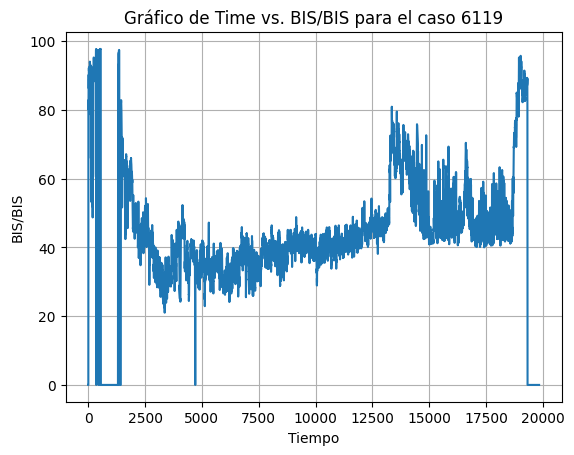

In [ ]:
cases = [5349, 6119, 4650, 3533, 1166, 1710, 6292, 52, 4282, 4475, 2716, 3710]
caso_deseado = 6119

for caso, df in resultados['con_datos']:
    if caso == caso_deseado:

        for columna in df.columns:
            if columna != 'Time':
                # Interpolación
                interL = interpolate.interp1d(df['Time'],  df[columna])
                tnew = np.arange(df['Time'].iloc[0], len(df['Time']), 1/250)
                ylinear = interL(tnew)
                plt.figure()
                plt.plot(tnew,ylinear)
                plt.xlabel('Tiempo')
                plt.ylabel(columna)
                plt.title(f'Gráfico de Time vs. {columna} para el caso {caso_deseado}')
                plt.grid(True)
                plt.show()

In [ ]:
tnew

array([5.2500000e-01, 5.2900000e-01, 5.3300000e-01, ..., 1.9832989e+04,
       1.9832993e+04, 1.9832997e+04])

In [ ]:
 # Encontrando la señal bis del segmento corresponiente
tiempo_start =5000
tiempo_end =tiempo_start+60
time_pac_bis =resultados['con_datos'][12][1]['Time']
señal_pac_bis =resultados['con_datos'][12][1]['BIS/BIS']
fcubic = interpolate.interp1d(time_pac_bis, señal_pac_bis, kind='cubic')
tnew = np.arange(time_pac_bis[0], len(time_pac_bis), 1/250)
ycubic = fcubic(tnew)
tiempo_start_bis=int(tiempo_start)
tiempo_end_bis=int(tiempo_end)
#time_pac_bis=[int(i) for i in time_pac_bis]

Fs2=250
#Observando la señal BIS del segmento ecg
muestra_start=(tiempo_start_bis*Fs2)
muestra_end=tiempo_end_bis*Fs2
egm_bis=ycubic[muestra_start:muestra_end]
egm_bis

#---------------------------------------
pacientes= [0, 1]
data_list=[]
for i in pacientes:
    time_pac_bis =resultados['con_datos'][0][i]['Time']
    señal_pac_bis =resultados['con_datos'][0][i]['BIS/BIS']
    fcubic = interpolate.interp1d(time_pac_bis, señal_pac_bis, kind='cubic')
    tnew = np.arange(time_pac_bis[0], len(time_pac_bis), 1/250)
    ycubic = fcubic(tnew)
    for start_time in range(0,10,1)
        tiempo_start = df_seg_good['Tiempo_Start'][start_time]
        tiempo_end =tiempo_start +60
        tiempo_start_bis=int(tiempo_start)
        tiempo_end_bis=int(tiempo_end)


        Fs2=250
        #Observando la señal BIS del segmento ecg
        muestra_start=(tiempo_start_bis*Fs2)
        muestra_end=tiempo_end_bis*Fs2
        seg_bis=ycubic[muestra_start:muestra_end]

        segment_data = {
            'ID_Paciente': id_case,
            'Tiempo_Start': tiempo_start,
            'Tiempo_End': tiempo_end,
            'Segmento_BIS':seg_bis
            }

        # Agrega el diccionario como una nueva fila al DataFrame
        data_list.append(segment_data)

        # Crea un DataFrame a partir de la lista de datos
        df_seg_bis = pd.DataFrame(data_list)


In [ ]:



bis_original =resultados['con_datos'][0][1]['BIS/BIS']

# Crear una función de interpolación a partir del tacograma original
interpolador = interp1d(np.arange(len(resultados['con_datos'][0][1]['BIS/BIS'])), bis_original, kind='linear')

# Crear un nuevo tacograma
nuevo_tamano = 15000
bis_remuestreado = interpolador(np.linspace(0, len(resultados['con_datos'][0][1]['BIS/BIS'])-1, nuevo_tamano))

#Coherencia ondas cerebrales

In [ ]:

estado = []
estados = [1] * 155
segmentos_cumplen_condicion_0= 0
segmentos_cumplen_condicion_1= 0
segmentos_cumplen_condicion_2= 0
segmentos_cumplen_condicion_3= 0
segmentos_cumplen_condicion_4 =0
seg_0 = []
seg_1 = []
seg_2 = []
seg_3 = []
seg_4 = []
for seg in range(155):
    mean_bis_seg = np.mean(df_pacientes['BIS_Segmentos'][seg])
    bis_seg = df_pacientes['BIS_Segmentos'][seg]
    id_case = df_pacientes['ID_Paciente'][seg]

    if 80 <= mean_bis_seg <= 100:
        estados[seg] = 0
        seg_0.append(seg)
        segmentos_cumplen_condicion_0 += 1
    elif 60 <= mean_bis_seg <= 80:
        estados[seg] = 1
        seg_1.append(seg)
        segmentos_cumplen_condicion_1 += 1
    elif 40 <= mean_bis_seg <= 60:
        estados[seg] = 2
        seg_2.append(seg)
        segmentos_cumplen_condicion_2 += 1
    elif 20 <= mean_bis_seg <= 40:
        estados[seg] = 3
        seg_3.append(seg)
        segmentos_cumplen_condicion_3 += 1
    elif 0 <= mean_bis_seg <= 20:
        estados[seg] = 4
        seg_4.append(seg)
        segmentos_cumplen_condicion_4 += 1
    segment_data = {
        'ID_Paciente': id_case,
        'Media_BIS': mean_bis_seg,
        'Estado': estados[seg]
    }

    estado.append(segment_data)

# Crear DataFrame fuera del bucle
df_estados = pd.DataFrame(estado)
print("Despierto:", segmentos_cumplen_condicion_0)
print("Sedación moderada:", segmentos_cumplen_condicion_1)
print("Anestesia general:", segmentos_cumplen_condicion_2)
print("Anestesia profunda:", segmentos_cumplen_condicion_3)
print("EEG Isoeléctrico:", segmentos_cumplen_condicion_4)


Despierto: 0
Sedación moderada: 2
Anestesia general: 95
Anestesia profunda: 58
EEG Isoeléctrico: 0


In [ ]:
from scipy import signal
Coherencia_ondas = []
bis = []
data_estados = []
for seg in range(0,69,1):
    eeg1= df['EEG1'].iloc[seg]
    eeg2 = df['EEG2'].iloc[seg]

    estado = df['Estado'].iloc[seg]
    BIS =  df['seg_bis'].iloc[seg]
    fs = 250
    f_eeg1, Peeg1= signal.csd(eeg1,eeg1, fs, nperseg=1024)
    f_eeg2, Peeg2= signal.csd(eeg2,eeg2, fs, nperseg=1024)
    fee12, Pee12 = signal.csd(eeg2, eeg1, fs, nperseg=1024)

    g_ee12 = Pee12/ np.sqrt(Peeg2 * Peeg1)
    phi_ee12 = np.unwrap(np.angle(g_ee12))

    lagcoh = (Pee12.imag)**2 / ((Peeg2 * Peeg1) - (Pee12.real)**2)

    #Deinir parte imaginaria y parte real
    mean_seg_coh = np.mean(g_ee12.real)
    desv_seg_coh = np.std(g_ee12.real)

    mean_seg_cohi = np.mean((Pee12.imag)**2)
    desv_seg_cohi = np.std((Pee12.imag)**2)

    mean_seg_Fase = np.mean(phi_ee12)
    desv_seg_Fase = np.std(phi_ee12)

    mean_seg_cohrez = np.mean(lagcoh)
    desv_seg_cohrez = np.std(lagcoh)

    Coherencia_ondas.append(mean_seg_coh)
    bis.append(np.median(BIS))
    resultados ={


        'Estado': estado,
        'Coherencia_real':g_ee12.real,
        'Media_Coherencia_real':mean_seg_coh,
        'Des_Coherencia_real': desv_seg_coh,
        'Coherencia_imag':g_ee12.imag,
        'Media_Coherencia_imag':mean_seg_cohi,
        'Des_Coherencia_imag': desv_seg_cohi,
        'Coherencia_imag':g_ee12.imag,
        'Fase':phi_ee12,
        'Media_Fase':mean_seg_coh,
        'Des_Fase': desv_seg_coh,
        'Coherencia_rezagada': lagcoh,
        'Media_Coherencia_rez':mean_seg_cohrez,
        'Des_Coherencia_rez': desv_seg_cohrez,
        }
    data_estados.append(resultados)
    df_coherencia_cerebral = pd.DataFrame(data_estados)

In [ ]:
df_coherencia_cerebral

,Estado,Coherencia_real,Media_Coherencia_real,Des_Coherencia_real,Coherencia_imag,Media_Coherencia_imag,Des_Coherencia_imag,Fase,Media_Fase,Des_Fase,Coherencia_rezagada,Media_Coherencia_rez,Des_Coherencia_rez
0,0,"[0.22579329953281105, 0.11641025807078526, 0.0...",0.091008,0.121490,"[0.0, 0.248482392059659, 0.2687234815516414, -...",1.645192e-08,5.850558e-08,"[0.0, 1.132677101605238, 1.222902637737723, -0...",0.091008,0.121490,"[0.0, 0.0625917010987143, 0.07290465998413712,...",0.015945,0.022756
1,0,"[0.1950959473989935, 0.2707020096448394, 0.071...",0.090986,0.146470,"[0.0, 0.11994368175755515, 0.1148041704855152,...",1.717473e-08,5.963299e-08,"[0.0, 0.41708756832191674, 1.0167522761039822,...",0.090986,0.146470,"[0.0, 0.01552408520674371, 0.01324682640150829...",0.018494,0.024167
2,0,"[0.18679960316812838, 0.09890574149081079, 0.1...",0.063146,0.149396,"[0.0, -0.026443661314709693, 0.015507541526460...",1.796846e-08,6.463841e-08,"[0.0, -0.2612516802118671, 0.09571844914465161...",0.063146,0.149396,"[0.0, 0.0007061752743858002, 0.000246925571009...",0.021519,0.031041
3,0,"[-0.11539525982489761, -0.17847208406813442, -...",0.005556,0.159084,"[0.0, 0.19259933636211715, 0.17241993747324952...",1.326459e-08,4.106331e-08,"[3.141592653589793, 2.318141350259773, 2.62273...",0.005556,0.159084,"[0.0, 0.03831492218017991, 0.03271079719083472...",0.014826,0.018798
4,1,"[0.20280478226580098, -0.11804997757636942, -0...",0.072848,0.154860,"[0.0, -0.10984050132714647, -0.300832322204741...",1.628583e-08,5.319532e-08,"[0.0, -2.392202698480769, -1.7963961970363043,...",0.072848,0.154860,"[0.0, 0.012235446431997383, 0.0909335611483413...",0.018869,0.024673
...,...,...,...,...,...,...,...,...,...,...,...,...,...
64,3,"[0.5348330627460828, 0.6983310530778685, 0.804...",0.748120,0.123992,"[0.0, 0.173439721821811, 0.08255813349605447, ...",5.425042e+00,8.580465e+01,"[0.0, 0.24343753539564325, 0.10221555883489235...",0.748120,0.123992,"[0.0, 0.05871433938274841, 0.01935321509565309...",0.028400,0.040680
65,3,"[0.7951250879488334, 0.7829824501218574, 0.840...",0.696955,0.161243,"[0.0, -0.2062867627405697, -0.1474245189553898...",3.267697e+01,5.201046e+02,"[0.0, -0.25760886789533577, -0.173626253652472...",0.696955,0.161243,"[0.0, 0.10997672853297051, 0.07405368803234327...",0.034479,0.043912
66,3,"[0.7685008540153063, 0.8154209386501177, 0.855...",0.695187,0.150960,"[0.0, 0.1687839951071114, 0.1625696629015673, ...",2.818311e+01,4.576101e+02,"[0.0, 0.20410760790395824, 0.1878282952137201,...",0.695187,0.150960,"[0.0, 0.08501640794065467, 0.09845836464369244...",0.024891,0.035491
67,3,"[0.8537183729331457, 0.8723509228964041, 0.889...",0.731066,0.169157,"[0.0, 0.08615968145204204, 0.10058415953577793...",8.392605e+00,1.283690e+02,"[0.0, 0.09844793657736273, 0.11262337520324146...",0.731066,0.169157,"[0.0, 0.03106012798496882, 0.04838320562074032...",0.054961,0.069493


### Graficar coherencia y bis

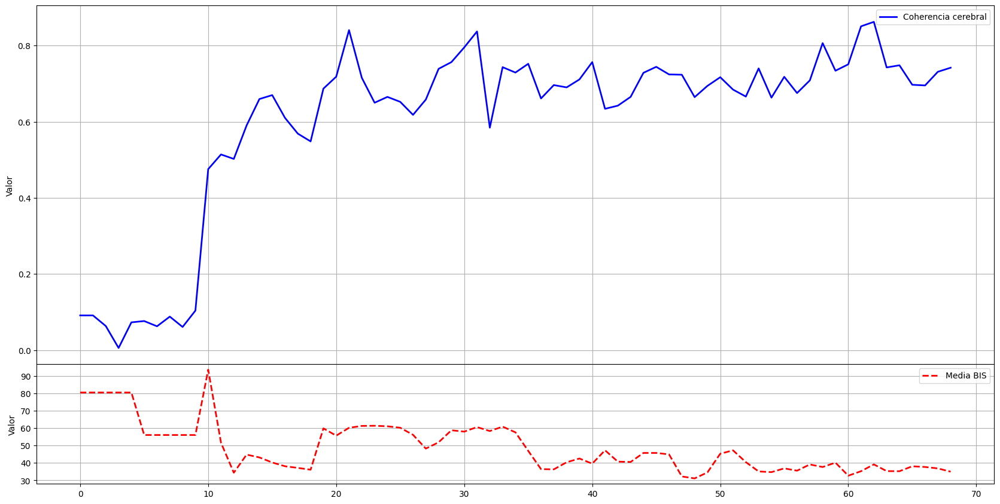

In [ ]:
y1 = Coherencia_ondas
y2 = bis

# Crear el primer gráfico más grande
plt.figure(figsize=(20, 10))  # Tamaño del primer gráfico
ax1 = plt.axes([0.1, 0.3, 0.8, 0.6])  # [left, bottom, width, height]
ax1.plot( y1, 'b', label='Coherencia cerebral', linewidth=2)  # Señal 1 en azul
ax1.set_ylabel('Valor')
ax1.legend()
plt.grid(True)
# Crear el segundo gráfico más pequeño y superponerlo en la parte inferior del primero
ax2 = plt.axes([0.1, 0.1, 0.8, 0.2])  # [left, bottom, width, height]
ax2.plot( y2, 'r--', label='Media BIS', linewidth=2)  # Señal 2 en rojo con líneas discontinuas
ax2.set_ylabel('Valor')
ax1.set_xlabel('Muestras')
ax2.legend()

# Mostrar los gráficos
plt.grid(True)
plt.show()


###  Box plot coherencia

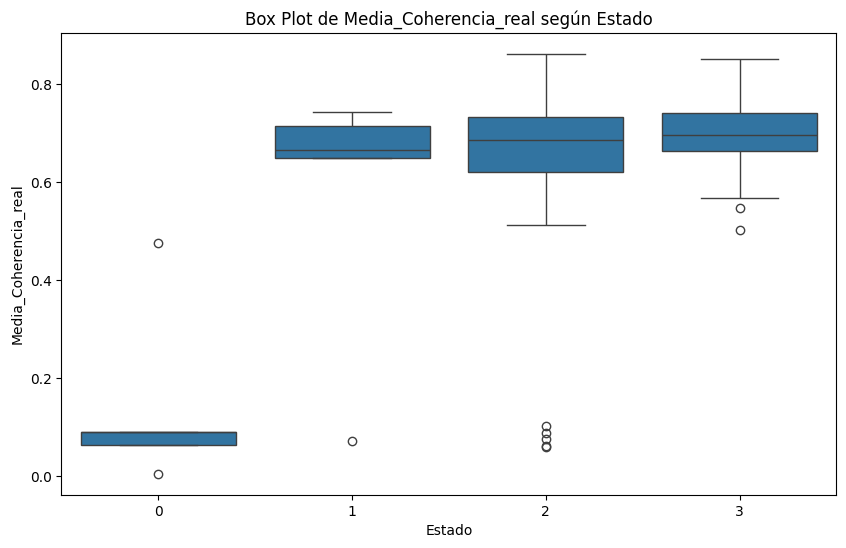

In [ ]:
# Seleccionar datos para los dos grupos de pacientes
paciente1 = df_coherencia_cerebral.loc[0:155, ['Estado', 'Media_Coherencia_real']]
#paciente2 = df_coherencia_cerebral.loc[30:59, ['Estado', 'Media_Coherencia_real', 'ID_paciente']]
#paciente3 = df_coherencia_cerebral.loc[60:89, ['Estado', 'Media_Coherencia_real', 'ID_paciente']]
#paciente4 = df_coherencia_cerebral.loc[90:119, ['Estado', 'Media_Coherencia_real', 'ID_paciente']]

# Concatenar los datos para todos pacientes
data = pd.concat([paciente1])

# Crear el boxplot con colores según el valor de 'Estado' y 'ID_paciente'
plt.figure(figsize=(10, 6))
sns.boxplot(data=data, x='Estado', y='Media_Coherencia_real')

# Personalizar el gráfico
plt.xlabel('Estado')
plt.ylabel('Media_Coherencia_real')
plt.title('Box Plot de Media_Coherencia_real según Estado')


# Mostrar el gráfico
plt.show()



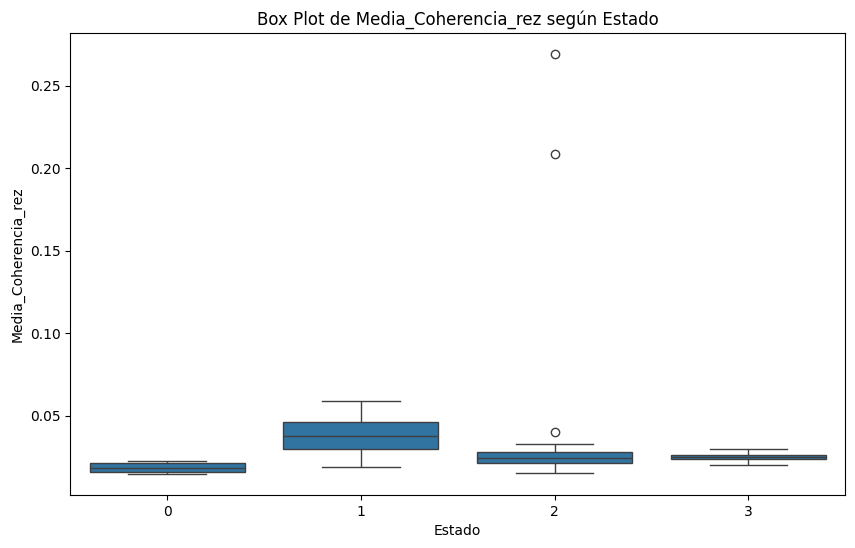

In [ ]:
paciente1 = df_coherencia_cerebral.loc[0:29, ['Estado', 'Media_Coherencia_rez']]
#paciente2 = df_coherencia_cerebral.loc[30:59, ['Estado', 'Media_Coherencia_rez', 'ID_paciente']]
#paciente3 = df_coherencia_cerebral.loc[60:89, ['Estado', 'Media_Coherencia_real', 'ID_paciente']]
#paciente4 = df_coherencia_cerebral.loc[90:119, ['Estado', 'Media_Coherencia_real', 'ID_paciente']]

# Concatenar los datos para todos pacientes
data = pd.concat([paciente1])

# Crear el boxplot con colores según el valor de 'Estado' y 'ID_paciente'
plt.figure(figsize=(10, 6))
sns.boxplot(data=data, x='Estado', y='Media_Coherencia_rez')

# Personalizar el gráfico
plt.xlabel('Estado')
plt.ylabel('Media_Coherencia_rez')
plt.title('Box Plot de Media_Coherencia_rez según Estado')


# Mostrar el gráfico
plt.show()

##Graficar cada segmento

Text(0, 0.5, 'Fase desenrollada (radianes)')

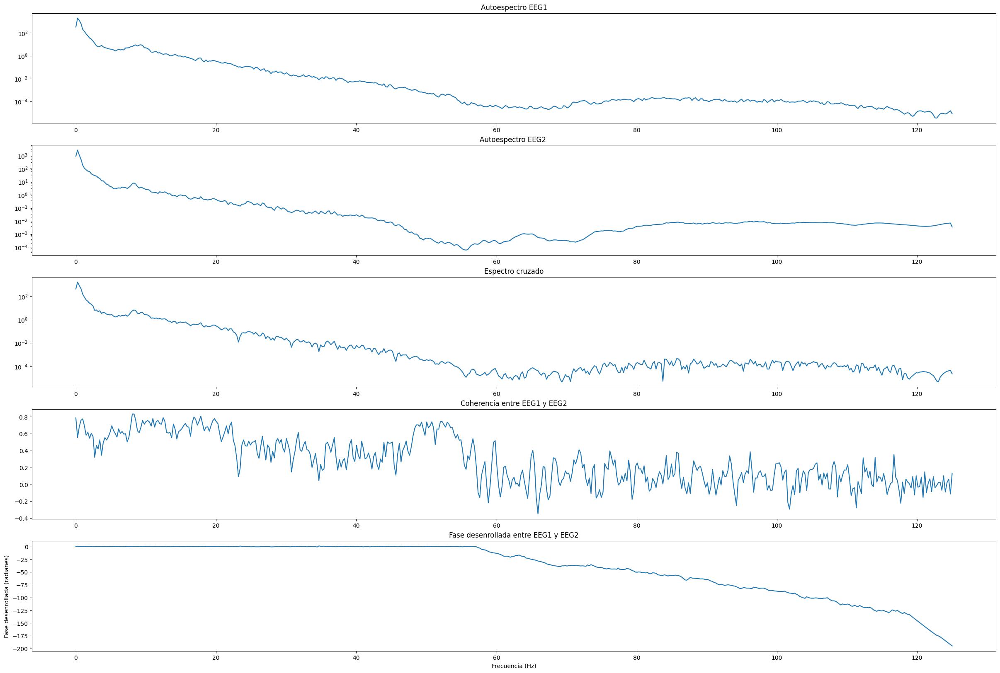

In [ ]:
paciente_idx = 150
eeg1= df['EEG1'].iloc[paciente_idx]
eeg2 = df['EEG2'].iloc[paciente_idx]


#Espectro para eeg1 y eeg2

f_eeg1, Peeg1= signal.csd(eeg1,eeg1, fs, nperseg=1024)

f_eeg2, Peeg2= signal.csd(eeg2,eeg2, fs, nperseg=1024)

fee12, Pee12 = signal.csd(eeg2, eeg1, fs, nperseg=1024)

g_ee12 = Pee12/ np.sqrt(Peeg2 * Peeg1)
phi_ee12 = np.unwrap(np.angle(g_ee12))

    # Crear subplots para el paciente actual - 0
plt.figure(figsize=(30,20))
plt.subplot(511)
plt.title('Autoespectro EEG1')
plt.semilogy(f_eeg1, np.abs(Peeg1))

plt.subplot(512)
plt.title('Autoespectro EEG2 ')
plt.semilogy(f_eeg2, np.abs(Peeg2))

plt.subplot(513)
plt.title('Espectro cruzado')
plt.semilogy(fee12, np.abs(Pee12))

plt.subplot(514)
plt.title('Coherencia entre EEG1 y EEG2')
plt.plot(fee12, g_ee12)

plt.subplot(515)
plt.title('Fase desenrollada entre EEG1 y EEG2')
plt.plot(fee12, phi_ee12)
plt.xlabel('Frecuencia (Hz)')
plt.ylabel('Fase desenrollada (radianes)')

##Graficar el segmento EEG y BIS

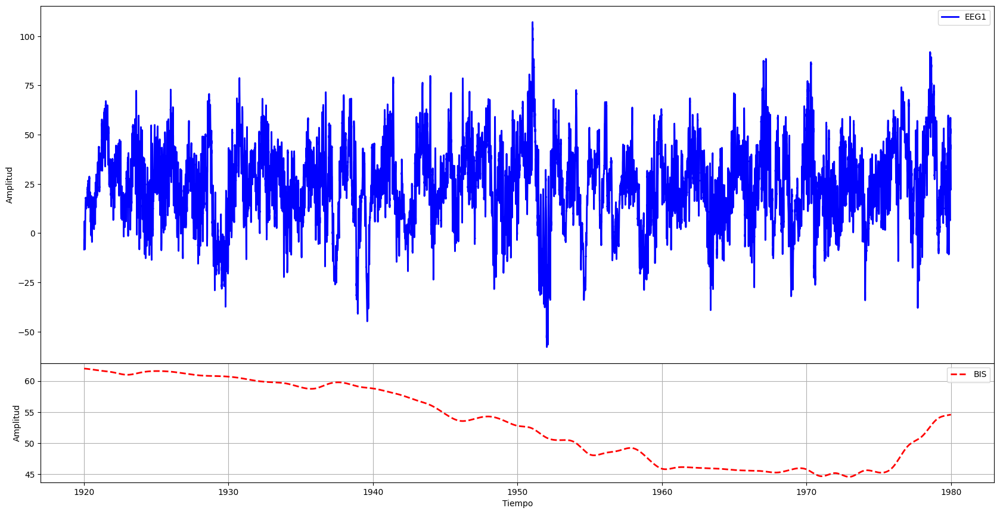

In [ ]:
# Graficar EEG y BIS
seg = 3
x = df['tiempo'][seg]
y2 = df['seg_bis'][seg]

# Crear el primer gráfico más grande
plt.figure(figsize=(20, 10))  # Tamaño del primer gráfico
ax1 = plt.axes([0.1, 0.3, 0.8, 0.6])  # [left, bottom, width, height]
ax1.plot(x, y1, 'b', label='EEG1', linewidth=2)  # Señal 1 en azul
ax1.set_xlabel('Tiempo')
ax1.set_ylabel('Amplitud')
ax1.legend()
plt.grid(True)

# Crear el segundo gráfico más pequeño y superponerlo en la parte inferior del primero
ax2 = plt.axes([0.1, 0.1, 0.8, 0.2])  # [left, bottom, width, height]
ax2.plot(x, y2, 'r--', label='BIS', linewidth=2)  # Señal 2 en rojo con líneas discontinuas
ax2.set_xlabel('Tiempo (s)')
ax2.set_ylabel('Amplitud')
ax2.legend()

# Mostrar los gráficos
plt.grid(True)
plt.show()


#Coherencia Cardiaca

In [ ]:
from scipy.interpolate import interp1d
from scipy.signal import welch

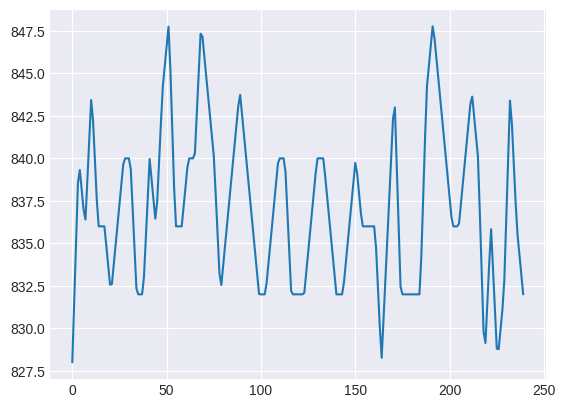

In [ ]:
seg = 0
tacograma_original =df['HRV'].iloc[seg]
plt.plot(tacograma_original)

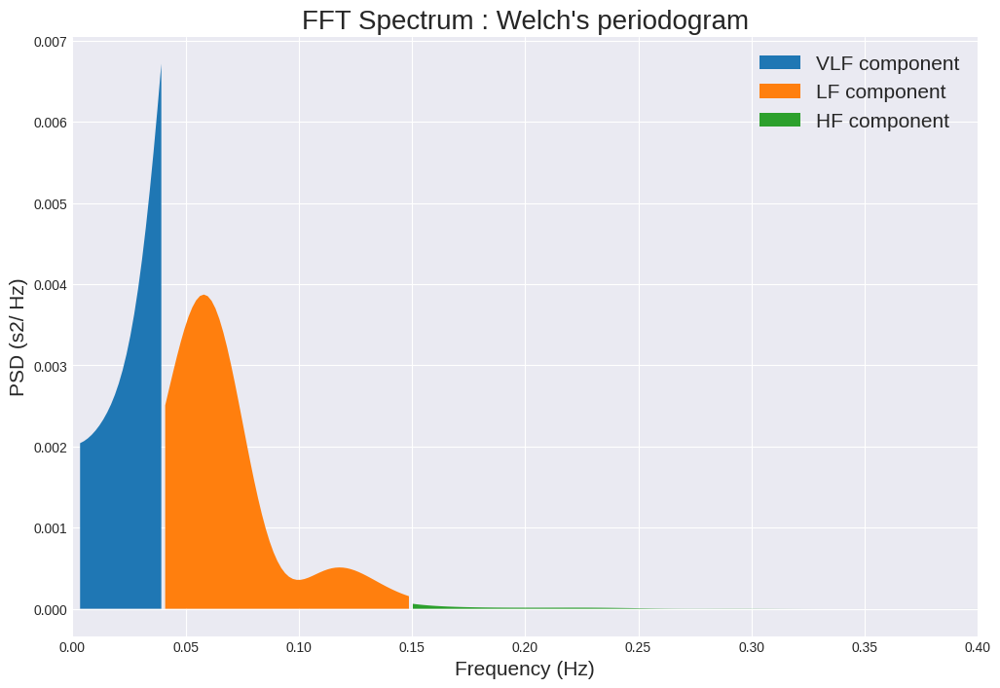

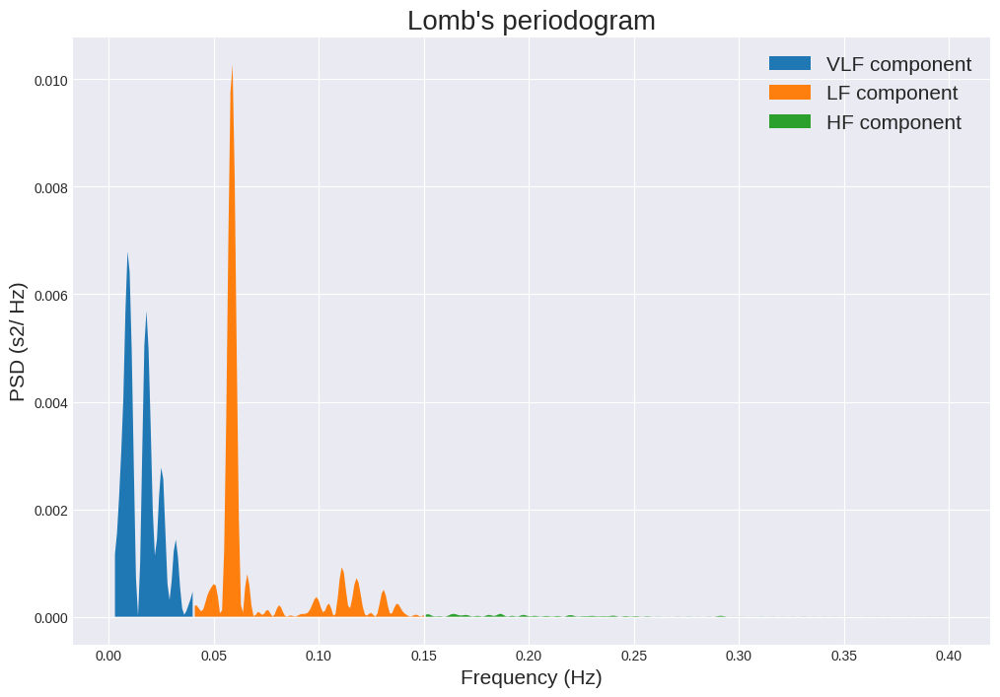

In [ ]:
plot_psd(tacograma_original, method="welch")
plot_psd(tacograma_original, method="lomb")

In [ ]:
intervalos_rr = tacograma_original

# Calcular el espectro de potencia usando el método de Welch
frecuencia, espectro = welch(intervalos_rr)

# Definir los rangos de frecuencia para las ventanas de interés
rango_frecuencia_maxima = (0.01, 0.15)  # Hz
rango_frecuencia_total = (0.0033, 0.4)  # Hz

# Encontrar los índices correspondientes a los rangos de frecuencia de interés
indices_maxima = np.where((frecuencia >= rango_frecuencia_maxima[0]) & (frecuencia <= rango_frecuencia_maxima[1]))


# Encontrar el pico más alto en el rango de 0.01-0.15 Hz
frecuencia_pico_maximo = frecuencia[indices_maxima][np.argmax(espectro[indices_maxima])]
ancho_ventana_maxima = 0.03  # Hz
indices_ventana_maxima = np.where((frecuencia >= frecuencia_pico_maximo - ancho_ventana_maxima / 2) & (frecuencia <= frecuencia_pico_maximo + ancho_ventana_maxima / 2))

# Encontrar los índices para la ventana de 0.0033-0.4 Hz
indices_ventana_total = np.where((frecuencia >= rango_frecuencia_total[0]) & (frecuencia <= rango_frecuencia_total[1]))

# Calcular la potencia máxima en la ventana de frecuencia de interés (integral)
potencia_maxima = np.trapz(espectro[indices_ventana_maxima])

# Calcular la potencia total en la ventana de frecuencia de interés (integral)
potencia_total = np.trapz(espectro[indices_ventana_total])

# Imprimir los resultados
print("Potencia Máxima en la Ventana de Frecuencia de Interés (0.01-0.15 Hz):", potencia_maxima)
print("Potencia Total en la Ventana de Frecuencia de Interés (0.0033-0.4 Hz):", potencia_total)
print("Coherencia:", potencia_maxima/potencia_total)


Potencia Máxima en la Ventana de Frecuencia de Interés (0.01-0.15 Hz): 2337.9296033787537
Potencia Total en la Ventana de Frecuencia de Interés (0.0033-0.4 Hz): 3487.630890926203
Coherencia: 0.670348920655957


In [ ]:
data_cohcardiaca = []
bis = []
Coherencia_cardiaca = []
for seg in range(0,155,1):
    ID = df['caseid'].iloc[seg]
    estado = df['Estado'].iloc[seg]
    tacograma =df['HRV'].iloc[seg]
    BIS = df['seg_bis'].iloc[seg]

    frecuencia, espectro = welch(tacograma)

    # Definir los rangos de frecuencia para las ventanas de interés
    rango_frecuencia_maxima = (0.01, 0.15)  # Hz
    rango_frecuencia_total = (0.0033, 0.4)  # Hz

    # Encontrar los índices correspondientes a los rangos de frecuencia de interés
    indices_maxima = np.where((frecuencia >= rango_frecuencia_maxima[0]) & (frecuencia <= rango_frecuencia_maxima[1]))

    # Encontrar el pico más alto en el rango de 0.01-0.15 Hz
    frecuencia_pico_maximo = frecuencia[indices_maxima][np.argmax(espectro[indices_maxima])]
    ancho_ventana_maxima = 0.03  # Hz
    indices_ventana_maxima = np.where((frecuencia >= frecuencia_pico_maximo - ancho_ventana_maxima / 2) & (frecuencia <= frecuencia_pico_maximo + ancho_ventana_maxima / 2))

    # Encontrar los índices para la ventana de 0.0033-0.4 Hz
    indices_ventana_total = np.where((frecuencia >= rango_frecuencia_total[0]) & (frecuencia <= rango_frecuencia_total[1]))

    # Calcular la potencia máxima en la ventana de frecuencia de interés (integral)
    potencia_maxima = np.trapz(espectro[indices_ventana_maxima])

    # Calcular la potencia total en la ventana de frecuencia de interés (integral)
    potencia_total = np.trapz(espectro[indices_ventana_total])

    coh_cardiaca = potencia_maxima/potencia_total
    Coherencia_cardiaca.append(coh_cardiaca)
    bis.append(np.median(BIS))
    resultados ={
        'ID_paciente':ID,
        'Estado': estado,
        'Potencia_Max':potencia_maxima,
        'Potencia_Total':potencia_total,
        'Coherencia_cardiaca': coh_cardiaca
       }
    data_cohcardiaca.append(resultados)
    df_coherencia_cardiaca = pd.DataFrame(data_cohcardiaca)

In [ ]:
df_coherencia_cardiaca

,ID_paciente,Estado,Potencia_Max,Potencia_Total,Coherencia_cardiaca
0,6147,0,318158.317074,747657.751999,0.425540
1,6147,0,732746.622903,941604.774922,0.778189
2,6147,0,252480.615345,364444.003832,0.692783
3,6147,0,157661.157564,461600.674710,0.341553
4,6147,1,258872.499086,499188.805218,0.518586
...,...,...,...,...,...
150,6147,3,19587.610595,30281.554902,0.646850
151,6147,3,2695.335296,6524.970786,0.413080
152,6147,3,7192.582267,19616.273265,0.366664
153,6147,3,5110.359501,16372.290183,0.312135


### Graficar coherencia y bis

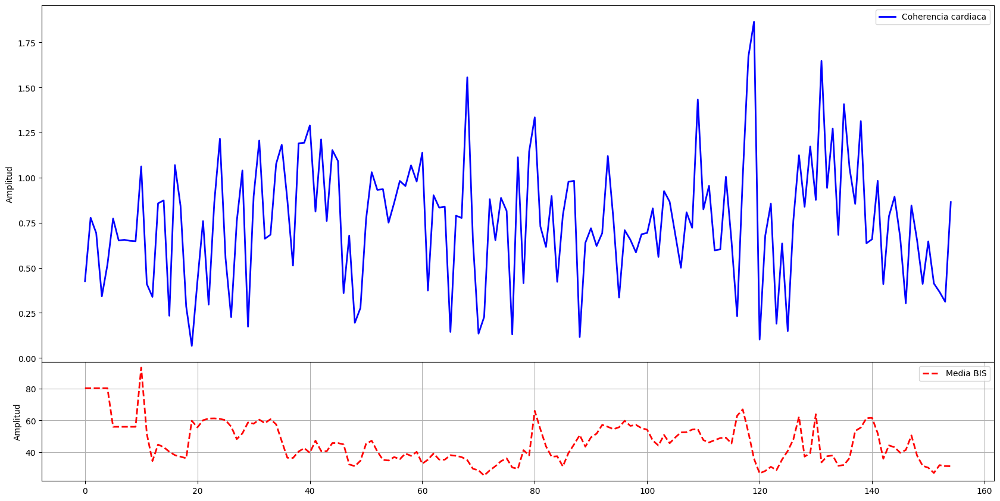

In [ ]:
y1 = Coherencia_cardiaca
y2 = bis


# Crear el primer gráfico más grande
plt.figure(figsize=(20, 10))  # Tamaño del primer gráfico
ax1 = plt.axes([0.1, 0.3, 0.8, 0.6])  # [left, bottom, width, height]
ax1.plot( y1, 'b', label='Coherencia cardiaca', linewidth=2)  # Señal 1 en azul
ax1.set_xlabel('Muestras')
ax1.set_ylabel('Amplitud')
ax1.legend()

# Crear el segundo gráfico más pequeño y superponerlo en la parte inferior del primero
ax2 = plt.axes([0.1, 0.1, 0.8, 0.2])  # [left, bottom, width, height]
ax2.plot( y2, 'r--', label='Media BIS', linewidth=2)  # Señal 2 en rojo con líneas discontinuas
ax2.set_ylabel('Amplitud')
ax2.legend()

# Mostrar los gráficos
plt.grid(True)
plt.show()


### Box plot coherencia

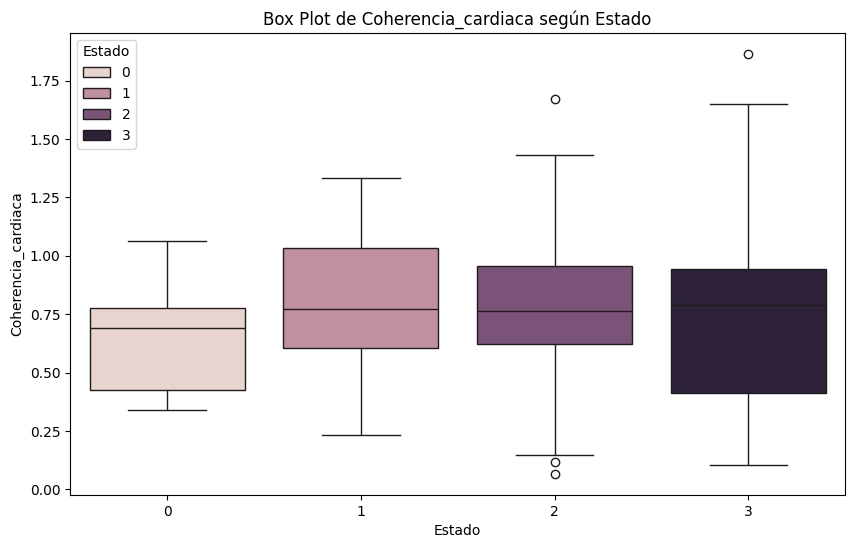

In [ ]:
data = df_coherencia_cardiaca.loc[0:183, ['Estado', 'Coherencia_cardiaca']]

# Crear el boxplot con colores según el valor de 'Estado'
plt.figure(figsize=(10, 6))
sns.boxplot(data=data, x='Estado', y='Coherencia_cardiaca', hue='Estado')

# Personalizar el gráfico
plt.xlabel('Estado')
plt.ylabel('Coherencia_cardiaca')
plt.title('Box Plot de Coherencia_cardiaca según Estado')
plt.legend(title='Estado')

# Mostrar el gráfico
plt.show()


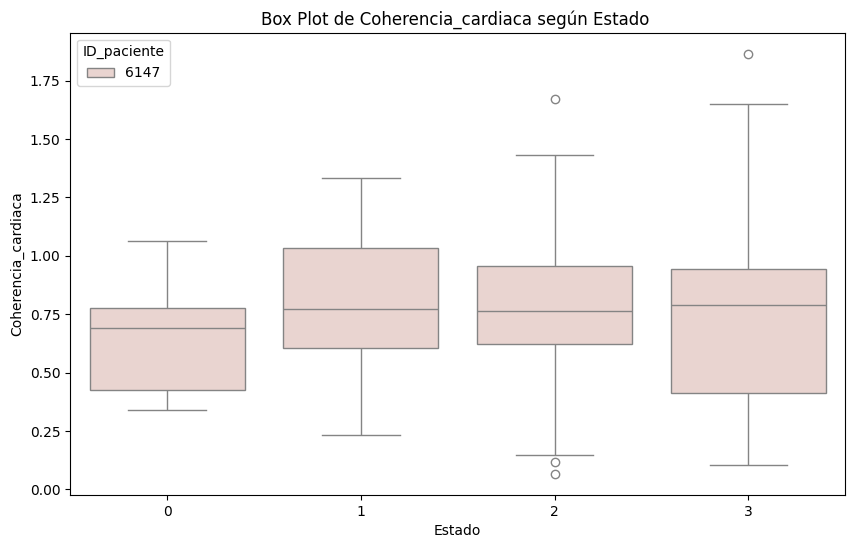

In [ ]:
# Seleccionar datos para los dos grupos de pacientes
paciente1 = df_coherencia_cardiaca.loc[0:155, ['Estado', 'Coherencia_cardiaca', 'ID_paciente']]
#paciente2 = df_coherencia_cardiaca.loc[30:59, ['Estado', 'Coherencia_cardiaca', 'ID_paciente']]
#paciente3 = df_coherencia_cardiaca.loc[60:89, ['Estado', 'Coherencia_cardiaca', 'ID_paciente']]
#paciente4 = df_coherencia_cardiaca.loc[90:119, ['Estado', 'Coherencia_cardiaca', 'ID_paciente']]
# Concatenar los datos para ambos pacientes
data = pd.concat([paciente1])

# Crear el boxplot con colores según el valor de 'Estado' y 'ID_paciente'
plt.figure(figsize=(10, 6))
sns.boxplot(data=data, x='Estado', y='Coherencia_cardiaca', hue='ID_paciente')

# Personalizar el gráfico
plt.xlabel('Estado')
plt.ylabel('Coherencia_cardiaca')
plt.title('Box Plot de Coherencia_cardiaca según Estado ')
plt.legend(title='ID_paciente')

# Mostrar el gráfico
plt.show()



#Coherencia entre EEG y ECG

In [ ]:
Coherencia = []
bis = []
data_estados = []
for seg in range(0,183,1):
    eeg1= df['eeg1_alpha'].iloc[seg]
    ecg2 = df['ecg2_gamma'].iloc[seg]

    estado = df['Estado'].iloc[seg]
    BIS =  df['seg_bis'].iloc[seg]
    fs = 250
    f_eeg1, Peeg1= signal.csd(eeg1,eeg1, fs, nperseg=1024)
    f_ecg2, Pecg2= signal.csd(ecg2,ecg2, fs, nperseg=1024)
    fec12, Pec12 = signal.csd(ecg2, eeg1, fs, nperseg=1024)

    g_ec12 = Pec12/ np.sqrt(Pecg2 * Peeg1)
    phi_ec12 = np.unwrap(np.angle(g_ec12))

    lagcoh = (Pec12.imag)**2 / ((Pecg2 * Peeg1) - (Pec12.real)**2)

    #Deinir parte imaginaria y parte real
    mean_seg_coh = np.mean(g_ec12.real)
    desv_seg_coh = np.std(g_ec12.real)

    mean_seg_cohi = np.mean((Pec12.imag)**2)
    desv_seg_cohi = np.std((Pec12.imag)**2)

    mean_seg_Fase = np.mean(phi_ec12)
    desv_seg_Fase = np.std(phi_ec12)

    mean_seg_cohrez = np.mean(lagcoh)
    desv_seg_cohrez = np.std(lagcoh)

    Coherencia.append(mean_seg_coh)
    bis.append(np.median(BIS))
    resultados ={


        'Estado': estado,
        'Coherencia_real':g_ec12.real,
        'Media_Coherencia_real':mean_seg_coh,
        'Des_Coherencia_real': desv_seg_coh,
        'Coherencia_imag':g_ec12.imag,
        'Media_Coherencia_imag':mean_seg_cohi,
        'Des_Coherencia_imag': desv_seg_cohi,
        'Coherencia_imag':g_ec12.imag,
        'Fase':phi_ec12,
        'Media_Fase':mean_seg_coh,
        'Des_Fase': desv_seg_coh,
        'Coherencia_rezagada': lagcoh,
        'Media_Coherencia_rez':mean_seg_cohrez,
        'Des_Coherencia_rez': desv_seg_cohrez,
        }
    data_estados.append(resultados)
    df_coherencia_c_c = pd.DataFrame(data_estados)

In [ ]:
df_coherencia_c_c

,Estado,Coherencia_real,Media_Coherencia_real,Des_Coherencia_real,Coherencia_imag,Media_Coherencia_imag,Des_Coherencia_imag,Fase,Media_Fase,Des_Fase,Coherencia_rezagada,Media_Coherencia_rez,Des_Coherencia_rez
0,0,"[-0.07888655296052723, -0.07883939418370665, -...",-0.000344,0.126571,"[0.0, 6.4487097211331025e-06, 0.00387357881578...",3.647815e-15,4.372159e-14,"[3.141592653589793, 3.1415108580639206, 3.1151...",-0.000344,0.126571,"[0.0, 4.18459568925448e-11, 1.5334720231115012...",0.016035,0.024903
1,0,"[0.24412555666081603, 0.24406377249120287, 0.2...",0.031065,0.151660,"[0.0, 1.01946257860602e-05, -0.006362392363956...",1.555471e-15,1.985808e-14,"[0.0, 4.177033599076486e-05, -0.02292818118454...",0.031065,0.151660,"[0.0, 1.1051335792840669e-10, 4.38558378796589...",0.015998,0.024131
2,0,"[-0.23002789341292004, -0.22996794612935273, -...",-0.028525,0.145417,"[0.0, 9.362271787200523e-06, -0.00381666725475...",1.575050e-15,1.357885e-14,"[3.141592653589793, 3.141551942386603, 3.15377...",-0.028525,0.145417,"[0.0, 9.254647717770663e-11, 1.615349198423757...",0.012180,0.017783
3,0,"[0.27598983940986593, 0.27596051849304926, 0.2...",0.023053,0.149636,"[0.0, 5.413775694176298e-06, -0.01045416918726...",2.476780e-15,2.911872e-14,"[0.0, 1.9617935649074147e-05, -0.0357581453811...",0.023053,0.149636,"[0.0, 3.1724956170456456e-11, 0.00011949450504...",0.018088,0.025470
4,1,"[-0.2032592253725184, -0.20315873989425218, -0...",-0.016425,0.139254,"[0.0, -2.0940737664193532e-05, 0.0343587579824...",1.761104e-15,2.235721e-14,"[3.141592653589793, 3.141695729330472, 3.04872...",-0.016425,0.139254,"[0.0, 4.5739267856193824e-10, 0.00136648005650...",0.015604,0.020811
...,...,...,...,...,...,...,...,...,...,...,...,...,...
178,2,"[-0.41478340337277086, -0.41468363626079563, -...",-0.030879,0.170106,"[0.0, -1.3501118223155595e-05, 0.0162534233691...",5.545248e-12,4.714088e-11,"[3.141592653589793, 3.1416252112241865, 3.1074...",-0.030879,0.170106,"[0.0, 2.2013519590384123e-10, 0.00034168027497...",0.017852,0.023446
179,2,"[0.01384876596331365, 0.013733130488842216, 0....",0.006525,0.129180,"[0.0, 1.992574036764684e-05, -0.00637463620006...",1.095118e-11,1.037369e-10,"[0.0, 0.0014509238371695897, -0.08015675556565...",0.006525,0.129180,"[0.0, 3.971100237018074e-10, 4.089351317921332...",0.016408,0.023836
180,2,"[0.2177930056518077, 0.2177950994094267, 0.242...",0.029001,0.146157,"[0.0, -5.614612802528113e-06, 0.01474269101754...",1.890314e-11,2.640755e-10,"[0.0, -2.5779334872588614e-05, 0.0607305172511...",0.029001,0.146157,"[0.0, 3.3093665178224175e-11, 0.00023092181095...",0.016764,0.024135
181,2,"[-0.3152521036875966, -0.3153120609935564, -0....",-0.010415,0.135021,"[0.0, 1.8850696546383005e-05, -0.0413391684310...",2.778643e-11,3.515528e-10,"[3.141592653589793, 3.141532869335222, 3.39465...",-0.010415,0.135021,"[0.0, 3.9457841548008107e-10, 0.00175373980212...",0.018435,0.026052


##Graficar coherencia y bis

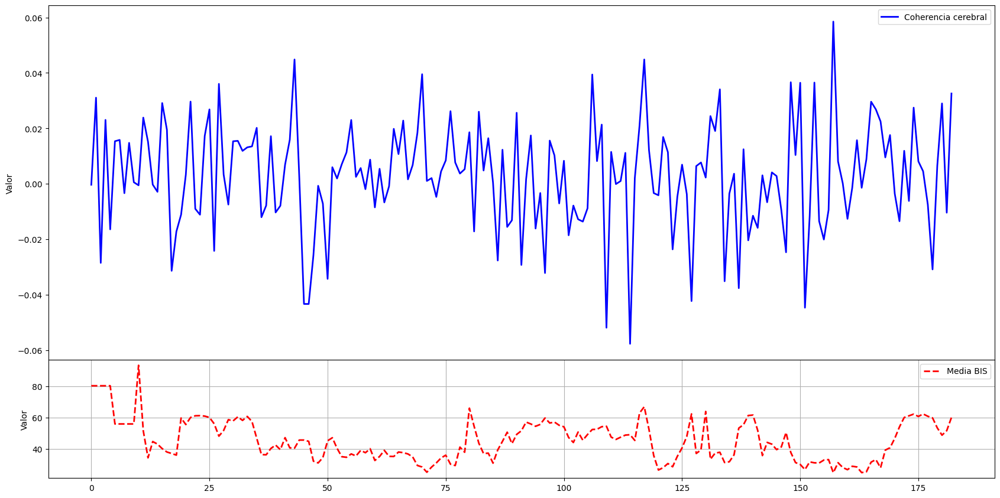

In [ ]:
y1 = Coherencia
y2 = bis


# Crear el primer gráfico más grande
plt.figure(figsize=(20, 10))  # Tamaño del primer gráfico
ax1 = plt.axes([0.1, 0.3, 0.8, 0.6])  # [left, bottom, width, height]
ax1.plot( y1, 'b', label='Coherencia cerebral', linewidth=2)  # Señal 1 en azul

ax1.set_ylabel('Valor')
ax1.legend()

# Crear el segundo gráfico más pequeño y superponerlo en la parte inferior del primero
ax2 = plt.axes([0.1, 0.1, 0.8, 0.2])  # [left, bottom, width, height]
ax2.plot( y2, 'r--', label='Media BIS', linewidth=2)  # Señal 2 en rojo con líneas discontinuas
ax2.set_ylabel('Valor')
ax1.set_xlabel('Muestras')
ax2.legend()

# Mostrar los gráficos
plt.grid(True)
plt.show()

##  Box plot coherencia

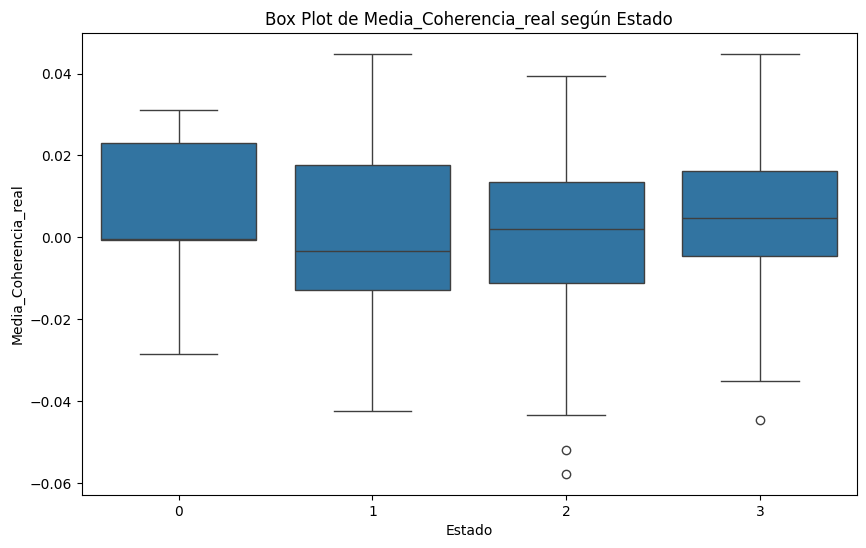

In [ ]:
# Seleccionar datos para los dos grupos de pacientes
paciente1 = df_coherencia_c_c.loc[0:155, ['Estado', 'Media_Coherencia_real']]
#paciente2 = df_coherencia_c_c.loc[30:59, ['Estado', 'Media_Coherencia_real', 'ID_paciente']]
#paciente3 = df_coherencia_c_c.loc[60:89, ['Estado', 'Media_Coherencia_real', 'ID_paciente']]
#paciente4 = df_coherencia_c_c.loc[90:119, ['Estado', 'Media_Coherencia_real', 'ID_paciente']]

# Concatenar los datos para todos pacientes
data = pd.concat([paciente1])

# Crear el boxplot con colores según el valor de 'Estado' y 'ID_paciente'
plt.figure(figsize=(10, 6))
sns.boxplot(data=data, x='Estado', y='Media_Coherencia_real')

# Personalizar el gráfico
plt.xlabel('Estado')
plt.ylabel('Media_Coherencia_real')
plt.title('Box Plot de Media_Coherencia_real según Estado')


# Mostrar el gráfico
plt.show()



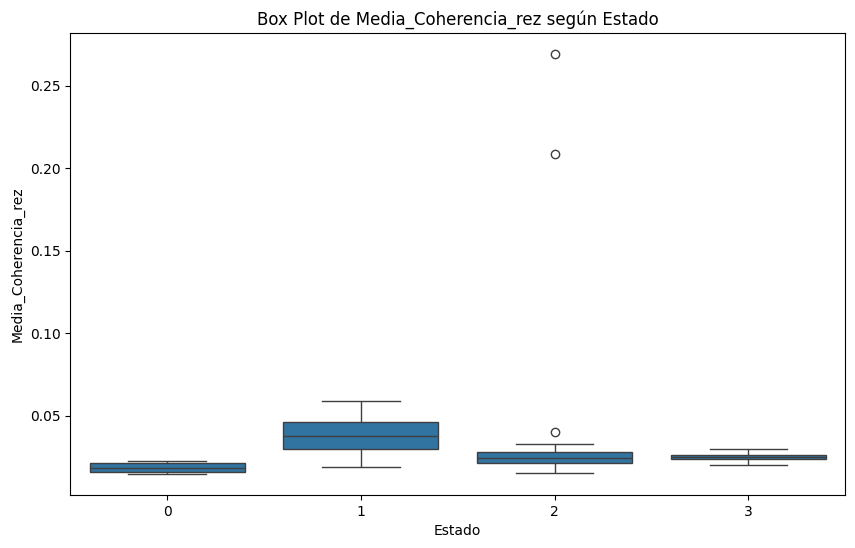

In [ ]:
paciente1 = df_coherencia_c_c.loc[0:29, ['Estado', 'Media_Coherencia_rez']]
#paciente2 = df_coherencia_c_c.loc[30:59, ['Estado', 'Media_Coherencia_rez', 'ID_paciente']]
#paciente3 = df_coherencia_c_c.loc[60:89, ['Estado', 'Media_Coherencia_real', 'ID_paciente']]
#paciente4 = df_coherencia_c_c.loc[90:119, ['Estado', 'Media_Coherencia_real', 'ID_paciente']]

# Concatenar los datos para todos pacientes
data = pd.concat([paciente1])

# Crear el boxplot con colores según el valor de 'Estado' y 'ID_paciente'
plt.figure(figsize=(10, 6))
sns.boxplot(data=data, x='Estado', y='Media_Coherencia_rez')

# Personalizar el gráfico
plt.xlabel('Estado')
plt.ylabel('Media_Coherencia_rez')
plt.title('Box Plot de Media_Coherencia_rez según Estado')


# Mostrar el gráfico
plt.show()

#Correlacion entre EEG y ECG

In [ ]:
Correlacion = []
bis = []
data_corr = []
for seg in range(0,183,1):
    eeg1= df['eeg1_alpha'].iloc[seg]
    ecg2 = df['ecg2_lenta'].iloc[seg]

    estado = df['Estado'].iloc[seg]
    BIS =  df['seg_bis'].iloc[seg]
    fs = 250

    corr = np.corrcoef(eeg1, ecg2)[0, 1]
    Correlacion.append(corr)
    bis.append(np.median(BIS))
    resultados ={


        'Estado': estado,
        'correlacion':corr

        }
    data_corr.append(resultados)
    df_corr_c_c = pd.DataFrame(data_corr)

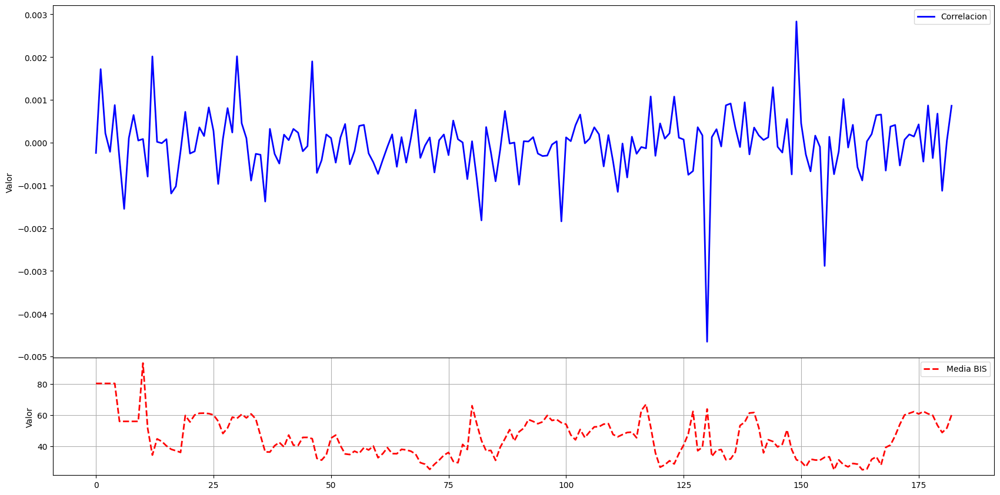

In [ ]:
y1 = Correlacion
y2 = bis


# Crear el primer gráfico más grande
plt.figure(figsize=(20, 10))  # Tamaño del primer gráfico
ax1 = plt.axes([0.1, 0.3, 0.8, 0.6])  # [left, bottom, width, height]
ax1.plot( y1, 'b', label='Correlacion', linewidth=2)  # Señal 1 en azul

ax1.set_ylabel('Valor')
ax1.legend()

# Crear el segundo gráfico más pequeño y superponerlo en la parte inferior del primero
ax2 = plt.axes([0.1, 0.1, 0.8, 0.2])  # [left, bottom, width, height]
ax2.plot( y2, 'r--', label='Media BIS', linewidth=2)  # Señal 2 en rojo con líneas discontinuas
ax2.set_ylabel('Valor')
ax1.set_xlabel('Muestras')
ax2.legend()

# Mostrar los gráficos
plt.grid(True)
plt.show()

##Correlacion entre caracteristicas

#Información Mutua

In [ ]:
from scipy.stats import entropy
import math

def mutual_information(x, y, bins):
    def normalize(series):
        return (series - np.mean(series)) / np.std(series)
    #xnor = normalize(x)
    #ynor = normalize(y)
    # Calcular histogramas conjuntos y marginales
    hist_xy, _, _ = np.histogram2d(x, y, bins=bins)
    hist_x = np.histogram(x, bins=bins)[0]
    hist_y = np.histogram(y, bins=bins)[0]

    # Calcular probabilidades conjuntas y marginales
    p_xy = hist_xy / np.sum(hist_xy)
    p_x = hist_x / np.sum(hist_x)
    p_y = hist_y / np.sum(hist_y)

    # Calcular la entropía de las señales y la conjunta
    h_x = entropy(p_x)
    h_y = entropy(p_y)
    h_xy = entropy(p_xy.flatten())

    # Calcular la información mutua
    mi = h_x + h_y - h_xy
    return  mi



In [ ]:
i = 150
x = df['EEG1'][i]
y = df['ECG'][i]
mi = mutual_information(x, y, bins=114)
mi

0.3278660239467994

In [ ]:
import numpy as np
from scipy.stats import norm
from sklearn.metrics import mutual_info_score

def calcular_informacion_mutua(x, y, bins):
    c_xy = np.histogram2d(x, y, bins)[0]
    mi = mutual_info_score(None, None, contingency=c_xy)
    return mi

# Generamos dos señales de ejemplo
#np.random.seed(0)
#X = np.random.normal(size=1000)
#Y = norm.pdf(X, 0, 1) + np.random.normal(scale=0.1, size=1000)

# Calculamos la información mutua
mi = calcular_informacion_mutua(x, y, bins=114)
mi

0.15584472243573

In [ ]:
data = x
bins = int((np.max(data) - np.min(data)) / (2 * (np.percentile(data, 75) - np.percentile(data, 25)) * len(data) ** (-1/3)))
bins

114

##Información Mutua entre segmentos

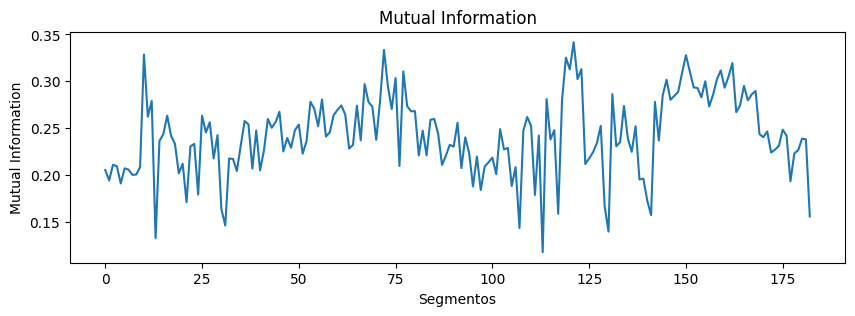

In [ ]:
mi_ = []

for i in range(0,183,1):
    x = df['EEG1'][i]
    y = df['ECG'][i]

    # Calcular mutual information
    mi = mutual_information(x, y, 114)
    mi_.append(mi)

# Graficar los valores de mutual information
plt.figure(figsize=(10, 3))
plt.plot(mi_)
plt.xlabel('Segmentos')
plt.ylabel('Mutual Information')
plt.title('Mutual Information')
plt.show()


## Informacion mutua entre caracteristicas

In [ ]:
conteo_caseid = df_caract['caseid'].value_counts()
cases = conteo_caseid.index
primeros_valores = cases[0:10]
x_ = []
y_ = []
for i in range(0, len(primeros_valores)):

    numero_caseid = primeros_valores[i]
    df_paciente1 = df_caract.loc[df_caract['caseid'] == numero_caseid]

    for indice, fila in df_paciente1.iterrows():

        x = fila['eeg1_alpha_mobility']
        y = fila['ecg2_alpha_mobility']
        x_.append(x)
        y_.append(y)
    mi = mutual_information(x_, y_) # MI total -> teniendo en cuenta todos los segmentos
    print(f"Caseid: {numero_caseid}, MI: {mi} ")

    # Limpiar listas para la siguiente iteración
    x_ = []
    y_ = []

Caseid: 5687.0, MI: 0.2904924437713685 
Caseid: 2154.0, MI: 0.19665092822033836 
Caseid: 4341.0, MI: 0.35180381738828403 
Caseid: 5693.0, MI: 0.1971967490136448 
Caseid: 6351.0, MI: 0.36340576629801014 
Caseid: 4746.0, MI: 0.30205756513836146 
Caseid: 3854.0, MI: 0.2639879702745134 
Caseid: 4206.0, MI: 0.2584317497316202 
Caseid: 1602.0, MI: 0.2787711867023064 
Caseid: 1900.0, MI: 0.27089848427791274 


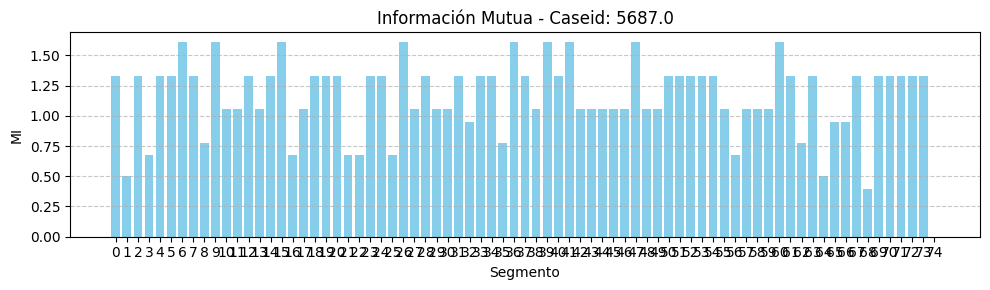

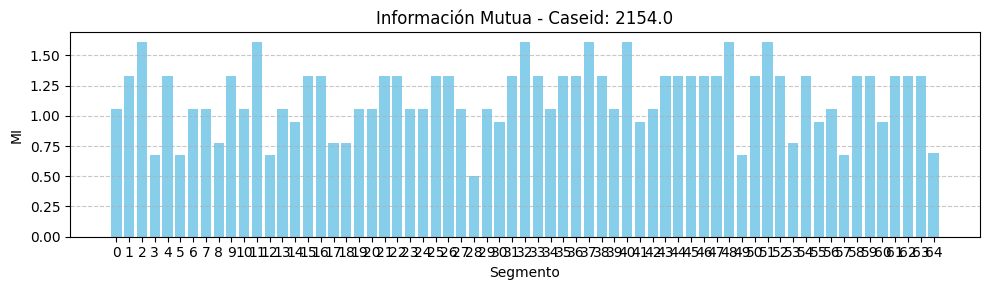

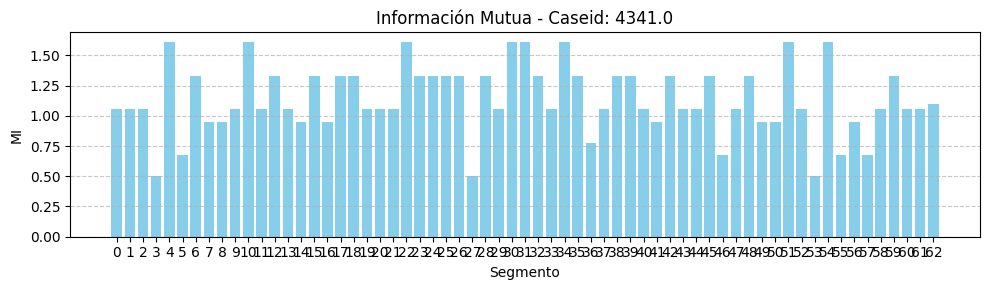

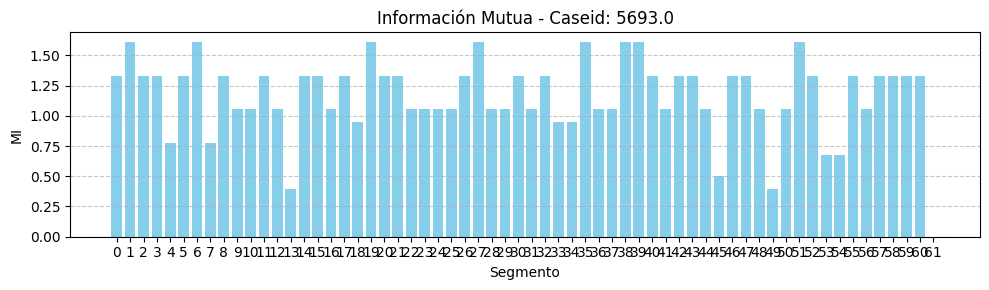

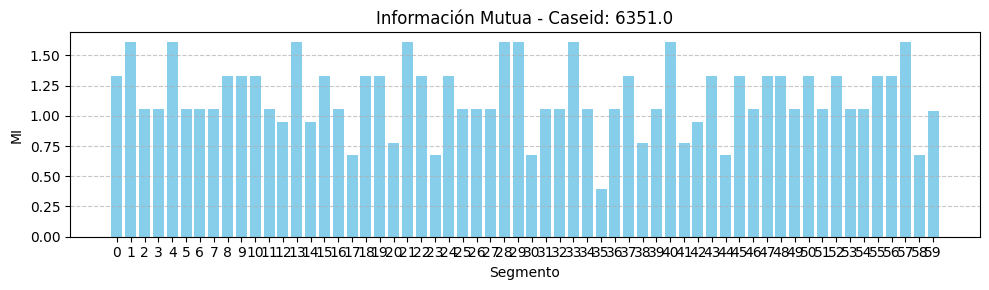

...

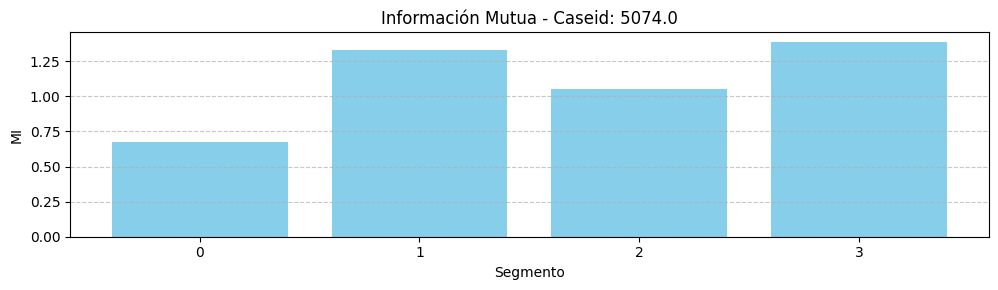

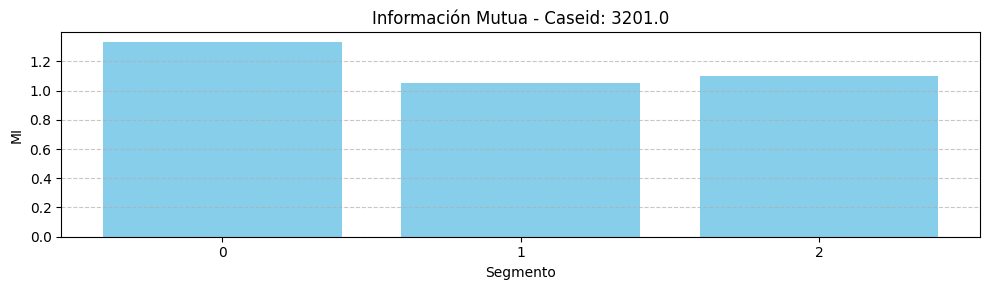

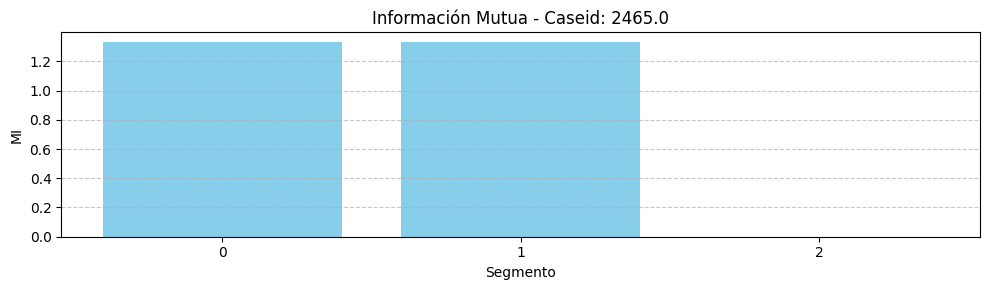

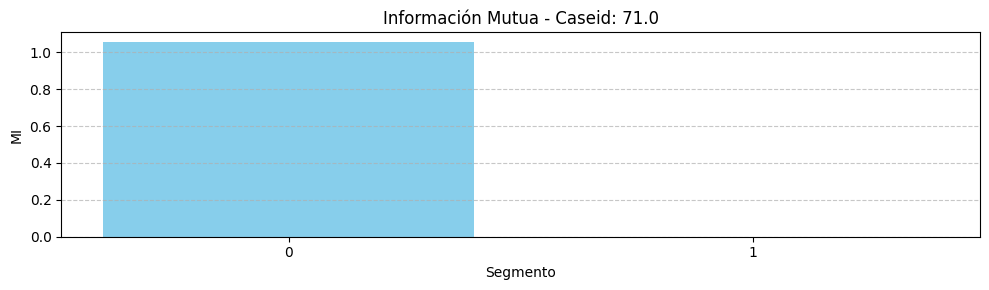

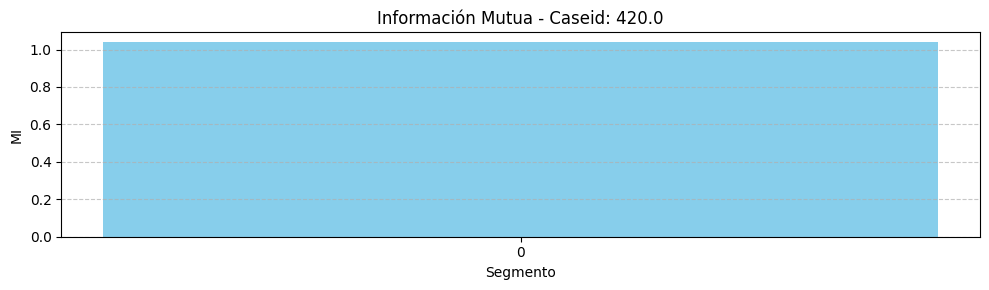

In [ ]:
conteo_caseid = df_caract['caseid'].value_counts()
cases = conteo_caseid.index
primeros_valores = cases[0:5]

#for i in range(0, len(primeros_valores)):
for numero_caseid in cases:
    #numero_caseid = primeros_valores[i]
    df_paciente1 = df_caract.loc[df_caract['caseid'] == numero_caseid]
    x_ = []
    y_ = []
    mi_por_paciente =[]
    for indice, fila in df_paciente1.iterrows():

        x = fila['eeg1_alpha_mobility']
        y = fila['ecg2_alpha_mobility']
        x_.append(x)
        y_.append(y)
        n_steps = 5 #Cada cinco segmentos - lo que equivale a cada 5 min -> el problema es si están seguidos -> la idea es ver como cambia en el tiempo

    for j in range(0, len(x_), n_steps):
        # Tomar los próximos 5 datos de x_ e y_
        segmento_x = x_[j:j+n_steps]
        segmento_y = y_[j:j+n_steps]

        # Calcular la información mutua para el segmento actual
        mi_segmento = mutual_information(segmento_x, segmento_y)
        mi_por_paciente.append(mi_segmento)
        #print(f"MI para segmento {i//n_steps}: {mi_segmento}")

    plt.figure(figsize=(10, 3))
    plt.bar(range(len(mi_por_paciente)), mi_por_paciente, color='skyblue')
    plt.xlabel('Segmento')
    plt.ylabel('MI')
    plt.title(f'Información Mutua - Caseid: {numero_caseid}')
    plt.xticks(range(len(mi_por_paciente)))
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

    # Limpiar listas para la siguiente iteración
    x_ = []
    y_ = []

####Analisis Genral - Box plot

In [ ]:
caract_corazon= ['ecg2_alpha_curt','ecg2_curt','ecg2_theta_svd_ent','ecg2_beta_svd_ent','ecg2_higu_10','ecg2_beta_complexity',
         'ecg2_beta_mobility','ecg2_ske','ecg2_alpha_mobility','ecg2_pfd','ecg2_delta_higu_50','ecg2_gamma_svd_ent','ecg2_delta_complexity',
         'ecg2_median','ecg2_gamma_complexity','ecg2_alpha_svd_ent','ecg2_beta_higu_10','ecg2_theta_mobility','hrv_entropy_shan',
         'ecg2_spect_ent_f','hrv_std_hr','hrv_vlf','ecg2_gamma_entropy_Samp','ecg2_theta_complexity','ecg2_gamma_mobility',
         'ecg2_delta_higu_100','ecg2_higu_100','hrv_nni_50','ecg2_theta_pow','ecg2_alpha_var','ecg2_theta_rms','ecg2_theta_var',
         'ecg2_delta_var','ecg2_var','ecg2_gamma_rms','ecg2_alpha_rms','ecg2_std','hrv_elipse','hrv_cvnni','hrv_sd2','hrv_entropy_ren',
         'hrv_total_power','hrv_median_nni','ecg2_beta_spect_ent_f','hrv_tri_idx','ecg2_theta_spect_ent_f','hrv_cvsd','hrv_cvi','hrv_lf',
         'hrv_activity','hrv_sdnn','hrv_tinn']

caract_cerebro =['eeg1_higu_10','Prel_eeg1_beta','eeg1_higu_100','eeg1_entropy_ApEn','eeg1_higu_50',
         'eeg1_entropy_Samp','eeg1_lenta_pow','eeg1_lenta_var','eeg1_spect_ent_f','Prel_eeg1_gamma','eeg1_lenta_activity',
         'eeg1_beta_entropy_Samp','eeg1_pfd','eeg1_lenta_rms','eeg1_lenta_std','eeg1_mobility','Prel_eeg1_lenta','esp_rms_eeg1_gamma',
         'eeg1_alpha_tasa','esp_rms_eeg1_delta','eeg1_alpha_higu_10','eeg1_var','eeg1_alpha_mobility','esp_rms_eeg1_lenta','eeg1_std',
         'eeg1_alpha_pfd','eeg1_gamma_higu_100','eeg1_tasa','eeg1_beta_tasa','eeg1_h','eeg1_activity','eeg1_alpha_svd_ent','eeg1_katz',
         'eeg1_gamma_mobility','eeg1_theta_rms','esp_rms_eeg1_beta','esp_rms_eeg1_alpha','esp_rms_eeg1_theta','eeg1_gamma_pfd',
         'eeg1_lenta_higu_100']

In [ ]:
import pandas as pd
from sklearn.metrics import mutual_info_score

# Suponiendo que 'pacientes_seleccionados' es tu DataFrame original y 'df_paciente' contiene información detallada de cada paciente

conteo_caseid = df_caract['caseid'].value_counts()
conteo_filtrado = conteo_caseid[conteo_caseid > 50]
cases = conteo_filtrado.index

data_mi = []
estados = [0, 1, 2, 3]  # Los estados posibles

for estado in estados:
    estado_x = []
    estado_y = []
    for indice, fila in df_caract.iterrows():
        if fila['Estado'] == estado and fila['caseid'] in cases:  # Asegúrate de que solo consideras los casos filtrados
            estado_x.append(fila[caract_cerebro[0]])
            estado_y.append(fila[caract_corazon[0]])
    # Calcula la información mutua solo si hay datos en ambos grupos
    if estado_x and estado_y:
        mi = mutual_information(estado_x, estado_y)
        data_mi.append({'Estado': estado, 'Mutual_Information': mi})

df_MI = pd.DataFrame(data_mi)


###Analisis Masculino-Femenino

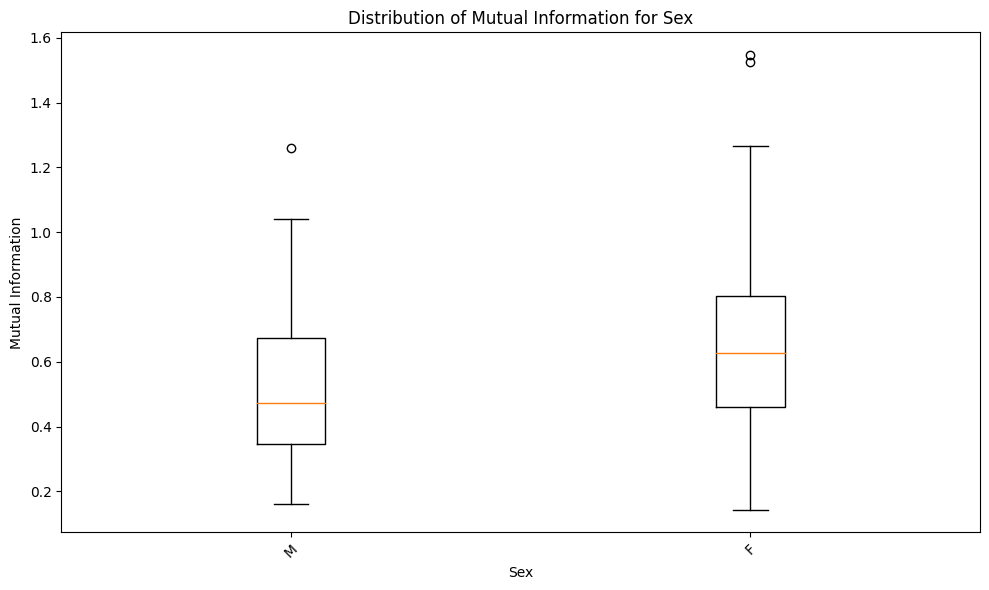

In [ ]:
case_ids = df_caract['caseid'].unique()

sexo = ['M', 'F']

MI_values = {sex: [] for sex in sexo}

for sex in sexo:
    df_pacientes = df_caract.loc[df_caract['sex'] == sex]

    for caseid in case_ids:
        df_paciente = df_pacientes[df_pacientes['caseid'] == caseid]

        if not df_paciente.empty:  # Check if the patient exists for the given sex
            x_ = df_paciente['eeg1_alpha_mobility'].tolist()
            y_ = df_paciente['ecg2_alpha_mobility'].tolist()

            # Calculate MI for the current patient and sex
            mi = mutual_information(x_, y_)
            MI_values[sex].append(mi)

# Create a box plot
plt.figure(figsize=(10, 6))
plt.boxplot(MI_values.values(), labels=MI_values.keys())
plt.xlabel('Sex')
plt.ylabel('Mutual Information')
plt.title('Distribution of Mutual Information for Sex')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


### Dependiendo del diagnostico

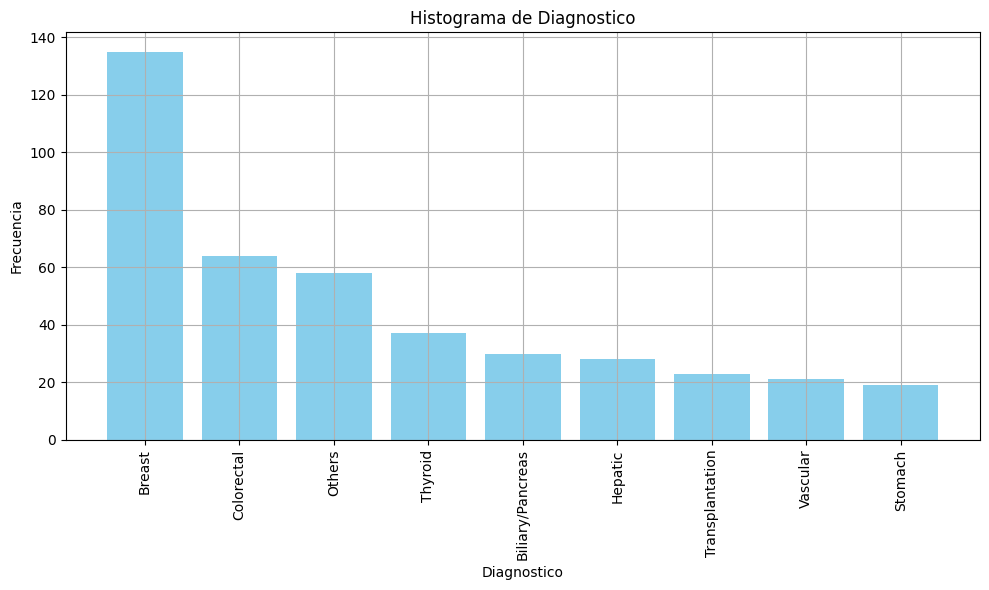

In [ ]:
from collections import Counter
datos = []
conteo_caseid = df_caract['caseid'].value_counts()
cases = conteo_caseid.index
for caseid in cases:
  age = df_caract.loc[df_caract['caseid'] == caseid, 'optype'].values
  if len(age) > 0:
      datos.append(age[0])  # Agrega el primer valor de edad si existe para el caseid dado
  else:
      datos.append(None)

# Contar la frecuencia de cada enfermedad
contador_enfermedades = Counter(datos)

# Convertir el conteo a listas separadas para el gráfico
enfermedades = list(contador_enfermedades.keys())
frecuencias = list(contador_enfermedades.values())

enfermedades_ordenadas = sorted(contador_enfermedades.keys(), key=lambda x: contador_enfermedades[x], reverse=True)
frecuencias_ordenadas = [contador_enfermedades[enfermedad] for enfermedad in enfermedades_ordenadas]

plt.figure(figsize=(10, 6))
plt.bar(enfermedades_ordenadas, frecuencias_ordenadas, color='skyblue')
plt.xlabel('Diagnostico')
plt.ylabel('Frecuencia')
plt.title('Histograma de Diagnostico')
plt.xticks(rotation=90)
plt.tight_layout()
plt.grid()
plt.show()

In [ ]:
enfermedades_ordenadas

['Breast',
 'Colorectal',
 'Others',
 'Thyroid',
 'Biliary/Pancreas',
 'Hepatic',
 'Transplantation',
 'Vascular',
 'Stomach']

In [ ]:
for enfermedad, frecuencia in zip(enfermedades_ordenadas, frecuencias_ordenadas):
    print(f"{enfermedad}: {frecuencia}")

Infiltrating ductal carcinoma of breast right: 32
Thyroid nodule: 28
Breast cancer left: 25
Breast cancer right: 22
Hepatocellular carcinoma: 18
Infiltrating ductal carcinoma of breast left: 15
Ductal carcinoma in situ of breast left: 10
Varicose vein of lower limb: 10
Rectal cancer: 9
Thyroid nodule : 9
Advanced gastric cancer: 8
Colon cancer, ascending: 8
Breast cancer unspecified side: 8
Pancreatic cancer: 7
Ductal carcinoma in situ of breast right: 7
Living liver donor: 6
End stage renal disease: 6
Cholangiocarcinoma, intrahepatic: 6
Advanced gastric cancer : 6
Hepatocellular carcinoma : 5
Colon cancer, hepatic flexure: 5
Metastatic cancer to the liver: 4
Rectal cancer : 4
Incisional hernia : 4
Colon cancer: 3
Pancreatic cancer : 3
Gallbladder cancer: 3
Colon cancer, sigmoid: 3
Pancreatic disease: 3
Varicose vein with nonspecific symptom: 3
Acute appendicitis: 3
Abdominal mass: 3
Common bile duct cancer, distal: 2
Liver cirrhosis Unspecified: 2
Klatskin tumor: 2
Intraductal papilla

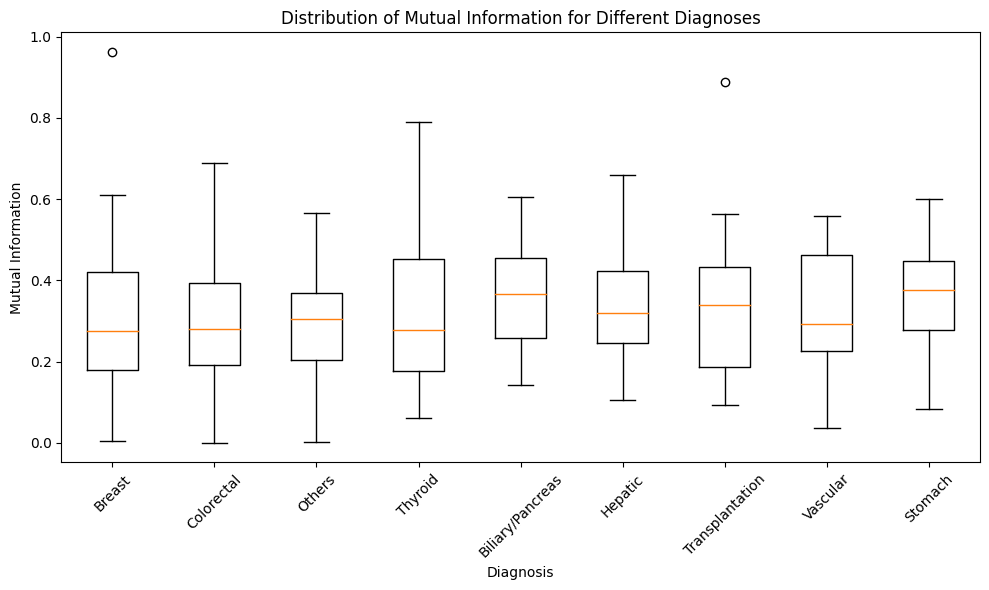

In [ ]:
conteo_caseid = df_caract['caseid'].value_counts()
cases = conteo_caseid.index
primeros_valores = cases[:]

enfermedades_ordenadas = ['Breast', 'Colorectal', 'Others', 'Thyroid', 'Biliary/Pancreas', 'Hepatic', 'Transplantation', 'Vascular', 'Stomach']
#enfermedades_ordenadas = ['Transplantation', 'Vascular', 'Stomach']
MI_values = {enfermedad: [] for enfermedad in enfermedades_ordenadas}

for enfermedad in enfermedades_ordenadas:
    df_pacientes = df_caract.loc[df_caract['optype'] == enfermedad]

    for caseid in df_pacientes['caseid'].unique():
        df_paciente = df_pacientes[df_pacientes['caseid'] == caseid]

        x_ = df_paciente['eeg1_alpha_mobility'].tolist()
        y_ = df_paciente['ecg2_alpha_mobility'].tolist()
        data = x_
        bins = int((np.max(data) - np.min(data)) / (2 * (np.percentile(data, 75) - np.percentile(data, 25)) * len(data) ** (-1/3)))
        # Calculate MI for the current patient and diagnosis
        mi = calcular_informacion_mutua(x_, y_,bins)
        MI_values[enfermedad].append(mi)

# Create a box plot
plt.figure(figsize=(10, 6))
plt.boxplot(MI_values.values(), labels=MI_values.keys())
plt.xlabel('Diagnosis')
plt.ylabel('Mutual Information')
plt.title('Distribution of Mutual Information for Different Diagnoses')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


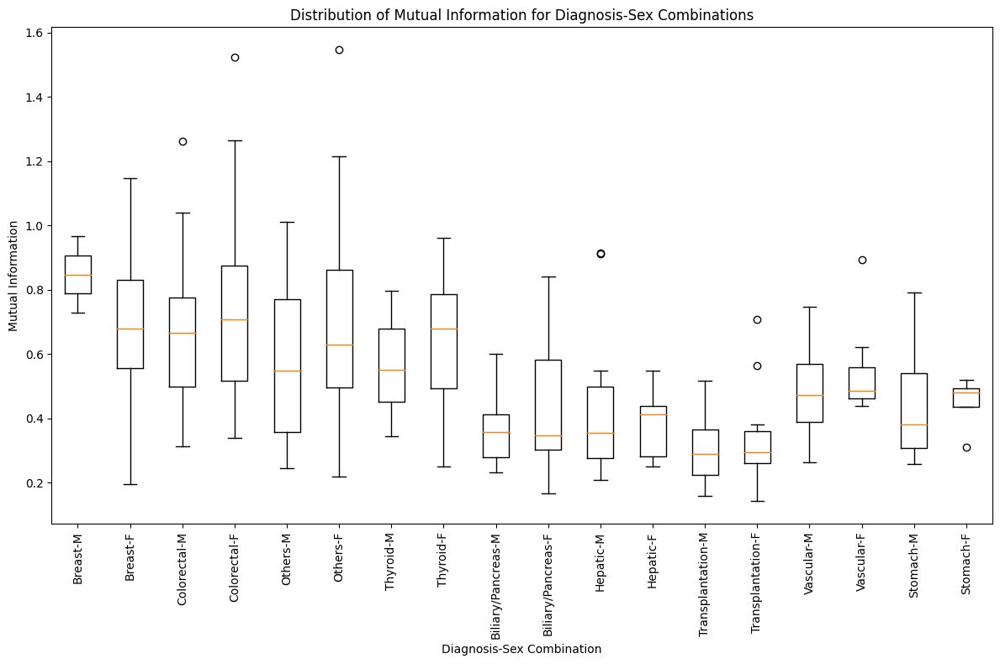

In [ ]:
enfermedades_ordenadas = ['Breast', 'Colorectal', 'Others', 'Thyroid', 'Biliary/Pancreas', 'Hepatic', 'Transplantation', 'Vascular', 'Stomach']
sexo = ['M', 'F']

# Create a list of all combinations of diagnosis and sex
combinations = [(diagnosis, sex) for diagnosis in enfermedades_ordenadas for sex in sexo]

MI_values = {combo: [] for combo in combinations}

for combo in combinations:
    enfermedad, sex = combo
    df_pacientes = df_caract.loc[(df_caract['optype'] == enfermedad) & (df_caract['sex'] == sex)]

    for caseid in df_pacientes['caseid'].unique():
        df_paciente = df_pacientes[df_pacientes['caseid'] == caseid]

        x_ = df_paciente['eeg1_alpha_mobility'].tolist()
        y_ = df_paciente['ecg2_alpha_mobility'].tolist()

        # Calculate MI for the current patient, diagnosis, and sex
        mi = mutual_information(x_, y_)
        MI_values[combo].append(mi)

# Create a grouped box plot
plt.figure(figsize=(12, 8))
positions = range(1, len(combinations) + 1)
plt.boxplot(MI_values.values(), positions=positions, labels=[f"{combo[0]}-{combo[1]}" for combo in combinations])
plt.xlabel('Diagnosis-Sex Combination')
plt.ylabel('Mutual Information')
plt.title('Distribution of Mutual Information for Diagnosis-Sex Combinations')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()


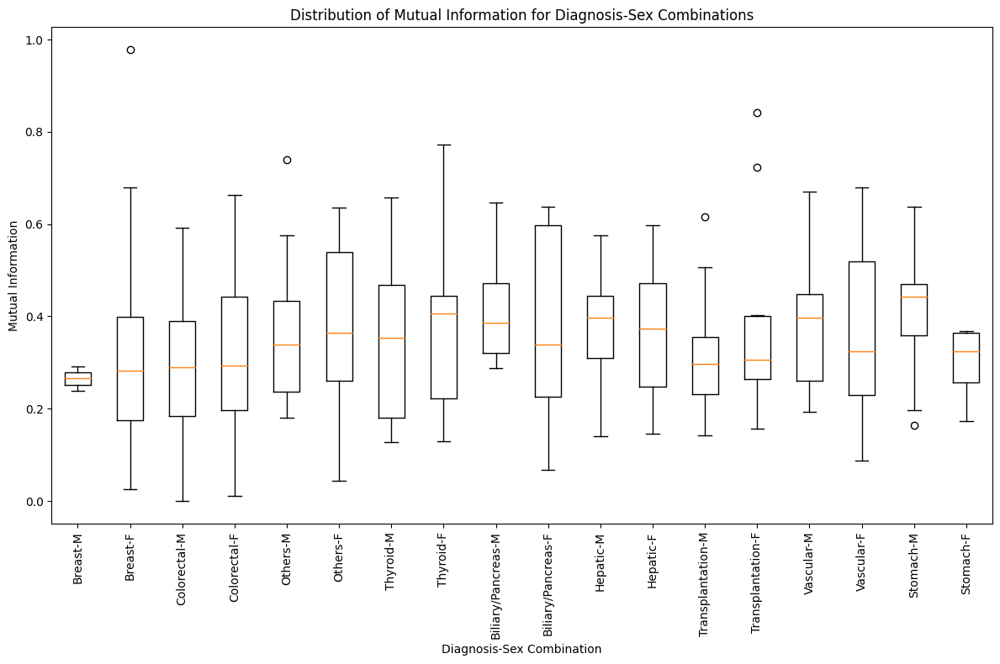

In [ ]:
enfermedades_ordenadas = ['Breast', 'Colorectal', 'Others', 'Thyroid', 'Biliary/Pancreas', 'Hepatic', 'Transplantation', 'Vascular', 'Stomach']
sexo = ['M', 'F']

# Create a list of all combinations of diagnosis and sex
combinations = [(diagnosis, sex) for diagnosis in enfermedades_ordenadas for sex in sexo]

MI_values = {combo: [] for combo in combinations}

for combo in combinations:
    enfermedad, sex = combo
    df_pacientes = df_caract.loc[(df_caract['optype'] == enfermedad) & (df_caract['sex'] == sex)]

    for caseid in df_pacientes['caseid'].unique():
        df_paciente = df_pacientes[df_pacientes['caseid'] == caseid]

        x_ = df_paciente['eeg1_alpha_mobility'].tolist()
        y_ = df_paciente['ecg2_gamma_mobility'].tolist()
        data = x_
        bins = int((np.max(data) - np.min(data)) / (2 * (np.percentile(data, 75) - np.percentile(data, 25)) * len(data) ** (-1/3)))
        # Calculate MI for the current patient, diagnosis, and sex
        mi = mutual_information(x_, y_, bins)
        MI_values[combo].append(mi)

# Create a grouped box plot
plt.figure(figsize=(12, 8))
positions = range(1, len(combinations) + 1)
plt.boxplot(MI_values.values(), positions=positions, labels=[f"{combo[0]}-{combo[1]}" for combo in combinations])
plt.xlabel('Diagnosis-Sex Combination')
plt.ylabel('Mutual Information')
plt.title('Distribution of Mutual Information for Diagnosis-Sex Combinations')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()


####Diagnosticos relacionados a temas mamarios

In [ ]:
cancer_de_mama = [
    "Infiltrating ductal carcinoma of breast right",
    "Breast cancer left",
    "Breast cancer right",
    "Infiltrating ductal carcinoma of breast left",
    "Ductal carcinoma in situ of breast left",
    "Breast cancer unspecified side",
    "Ductal carcinoma in situ of breast right",
    "Infiltrating ductal carcinoma of breast unspecified side",
    "Infiltrating lobular carcinoma of breast unspecified side",
    "Mucinous carcinoma of breast right",
    "Phyllodes tumor of breast, benign unspecified side",
    "Lobular carcinoma in situ of breast right",
    "Intraductal carcinoma in situ of breast left",
    "Intraductal papilloma of breast left",
    "Benign neoplasm of breast right",
    "Benign neoplasm of female breast unspecified side",
    "Benign neoplasm of breast left",
    "Fibroadenoma of breast right",
    "Fibroadenoma of breast left",
    "Breast disease",
    "Gynecomastia",
    "Accessory breast",
]

conteo_caseid_cancer_mama = df_caract[df_caract['dx'].isin(cancer_de_mama)]['caseid'].value_counts()


In [ ]:
conteo_pacientes_por_diagnostico = {}

# Iterar sobre la lista de diagnósticos
for diagnostico in cancer_de_mama:
    # Contar el número de pacientes con el diagnóstico actual y almacenarlo en el diccionario
    conteo_pacientes_por_diagnostico[diagnostico] = df_caract[df_caract['dx'] == diagnostico]['caseid'].nunique()

# Imprimir los resultados
for diagnostico, conteo in conteo_pacientes_por_diagnostico.items():
    print(" '{}': {}".format(diagnostico, conteo))

 'Infiltrating ductal carcinoma of breast right': 32
 'Breast cancer left': 25
 'Breast cancer right': 22
 'Infiltrating ductal carcinoma of breast left': 15
 'Ductal carcinoma in situ of breast left': 10
 'Breast cancer unspecified side': 8
 'Ductal carcinoma in situ of breast right': 7
 'Infiltrating ductal carcinoma of breast unspecified side': 2
 'Infiltrating lobular carcinoma of breast unspecified side': 1
 'Mucinous carcinoma of breast right': 1
 'Phyllodes tumor of breast, benign unspecified side': 1
 'Lobular carcinoma in situ of breast right': 1
 'Intraductal carcinoma in situ of breast left': 1
 'Intraductal papilloma of breast left': 1
 'Benign neoplasm of breast right': 1
 'Benign neoplasm of female breast unspecified side': 1
 'Benign neoplasm of breast left': 0
 'Fibroadenoma of breast right': 2
 'Fibroadenoma of breast left': 2
 'Breast disease': 0
 'Gynecomastia': 1
 'Accessory breast': 1


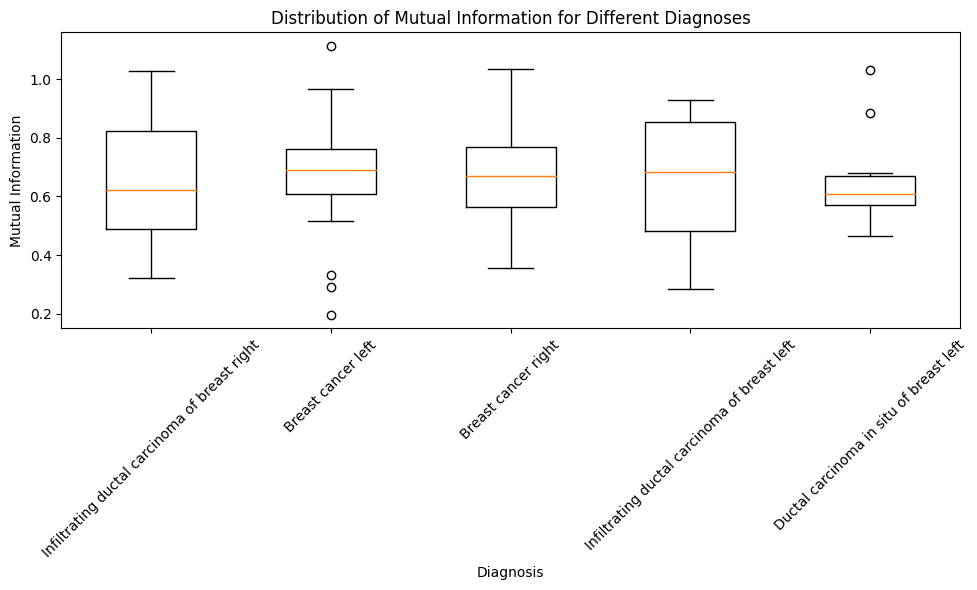

In [ ]:
conteo_caseid = df_caract['caseid'].value_counts()
cases = conteo_caseid.index
primeros_valores = cases[:]

enfermedades_ordenadas = ['Infiltrating ductal carcinoma of breast right', 'Breast cancer left', 'Breast cancer right', 'Infiltrating ductal carcinoma of breast left',
                            'Ductal carcinoma in situ of breast left']
MI_values = {enfermedad: [] for enfermedad in enfermedades_ordenadas}

for enfermedad in enfermedades_ordenadas:
    df_pacientes = df_caract.loc[df_caract['dx'] == enfermedad]

    for caseid in df_pacientes['caseid'].unique():
        df_paciente = df_pacientes[df_pacientes['caseid'] == caseid]

        x_ = df_paciente['eeg1_alpha_mobility'].tolist()
        y_ = df_paciente['ecg2_alpha_mobility'].tolist()

        # Calculate MI for the current patient and diagnosis
        mi = mutual_information(x_, y_)
        MI_values[enfermedad].append(mi)

# Create a box plot
plt.figure(figsize=(10, 6))
plt.boxplot(MI_values.values(), labels=MI_values.keys())
plt.xlabel('Diagnosis')
plt.ylabel('Mutual Information')
plt.title('Distribution of Mutual Information for Different Diagnoses')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

####Diagnosticos relacionados al colon

In [ ]:
colon = ["Colon cancer, ascending",
        "Colon cancer, hepatic flexure",
        "Colon cancer",
        "Colon cancer, sigmoid",
        "Colon cancer, transverse",
        "Colon cancer, rectosigmoid",
        "Colorectal cancer",
        "Cecal cancer"]

conteo_colon = df_caract[df_caract['dx'].isin(colon)]['caseid'].value_counts()

In [ ]:
conteo_pacientes_por_diagnostico = {}

# Iterar sobre la lista de diagnósticos
for diagnostico in colon:
    # Contar el número de pacientes con el diagnóstico actual y almacenarlo en el diccionario
    conteo_pacientes_por_diagnostico[diagnostico] = df_caract[df_caract['dx'] == diagnostico]['caseid'].nunique()

# Imprimir los resultados
for diagnostico, conteo in conteo_pacientes_por_diagnostico.items():
    print(" '{}': {}".format(diagnostico, conteo))

 'Colon cancer, ascending': 8
 'Colon cancer, hepatic flexure': 5
 'Colon cancer': 3
 'Colon cancer, sigmoid': 3
 'Colon cancer, transverse': 2
 'Colon cancer, rectosigmoid': 2
 'Colorectal cancer': 1
 'Cecal cancer': 1


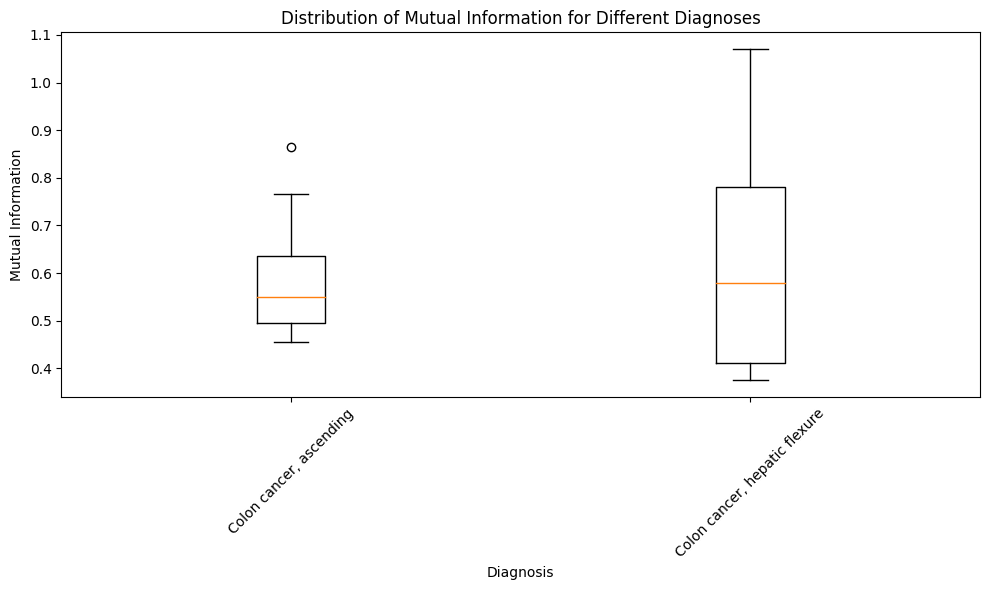

In [ ]:
conteo_caseid = df_caract['caseid'].value_counts()
cases = conteo_caseid.index
primeros_valores = cases[:]

enfermedades_ordenadas = ['Colon cancer, ascending', 'Colon cancer, hepatic flexure']
MI_values = {enfermedad: [] for enfermedad in enfermedades_ordenadas}

for enfermedad in enfermedades_ordenadas:
    df_pacientes = df_caract.loc[df_caract['dx'] == enfermedad]

    for caseid in df_pacientes['caseid'].unique():
        df_paciente = df_pacientes[df_pacientes['caseid'] == caseid]

        x_ = df_paciente['eeg1_alpha_mobility'].tolist()
        y_ = df_paciente['ecg2_alpha_mobility'].tolist()

        # Calculate MI for the current patient and diagnosis
        mi = mutual_information(x_, y_)
        MI_values[enfermedad].append(mi)

# Create a box plot
plt.figure(figsize=(10, 6))
plt.boxplot(MI_values.values(), labels=MI_values.keys())
plt.xlabel('Diagnosis')
plt.ylabel('Mutual Information')
plt.title('Distribution of Mutual Information for Different Diagnoses')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

####Diagnosticos relacionados al pancreas

In [ ]:
pancreas = [
        "Pancreatic cancer",
        "Neuroendocrine tumor of pancreas, G2",
        "Intraductal papillary mucinous neoplasm of pancreas, invasive",
        "Neuroendocrine tumor of pancreas, G1",
        "Neuroendocrine carcinoma of pancreas",
        "Malignant neoplasm of pancreas head",
        "Intraductal papillary mucinous neoplasm of pancreas, borderline",
        "Pancreatic disease"

    ]
conteo_pancreas = df_caract[df_caract['dx'].isin(pancreas)]['caseid'].value_counts()

In [ ]:
conteo_pacientes_por_diagnostico = {}

# Iterar sobre la lista de diagnósticos
for diagnostico in pancreas:
    # Contar el número de pacientes con el diagnóstico actual y almacenarlo en el diccionario
    conteo_pacientes_por_diagnostico[diagnostico] = df_caract[df_caract['dx'] == diagnostico]['caseid'].nunique()

# Imprimir los resultados
for diagnostico, conteo in conteo_pacientes_por_diagnostico.items():
    print(" '{}': {}".format(diagnostico, conteo))

 'Pancreatic cancer': 7
 'Neuroendocrine tumor of pancreas, G2': 2
 'Intraductal papillary mucinous neoplasm of pancreas, invasive': 2
 'Neuroendocrine tumor of pancreas, G1': 1
 'Neuroendocrine carcinoma of pancreas': 1
 'Malignant neoplasm of pancreas head': 1
 'Intraductal papillary mucinous neoplasm of pancreas, borderline': 1
 'Pancreatic disease': 3


###Dependiendo del anestesico y tipo operación

In [ ]:
nombres_tname = ['BIS/BIS','Orchestra/PPF20_CE','Orchestra/PPF20_CP','Orchestra/PPF20_CT',
 'Orchestra/PPF20_RATE','Orchestra/PPF20_VOL','Orchestra/RFTN20_CE','Orchestra/RFTN20_CP','Orchestra/RFTN20_CT','Orchestra/RFTN20_RATE',
 'Orchestra/RFTN20_VOL','Primus/EXP_SEVO','Primus/EXP_DES','Primus/INSP_SEVO', 'Primus/INSP_DES', 'Primus/FEN2O','Primus/FIN2O']
link = 'https://api.vitaldb.net/'

conteo_caseid_dx = df_caract.loc[df_caract['optype'] == 'Breast', 'caseid'].value_counts()
cases = conteo_caseid_dx.index

resultados = {'con_datos': [], 'con_error': [], 'con_ceros': []}


for case in cases:
    for nombre_tname in nombres_tname:
        td = df_trks.loc[df_trks['tname'] == nombre_tname]
        # Filtrar el DataFrame td por 'caseid' y seleccionar todos los resultados
        filas_deseadas = td.loc[td['caseid'] == case]

    # Verificar si se encontraron filas
        if not filas_deseadas.empty:

            for idx, fila in filas_deseadas.iterrows():
                anes_data = pd.read_csv(link + fila['tid'])

                non_time_cols = anes_data.columns[anes_data.columns != nombre_tname]
                any_non_zero = (anes_data[non_time_cols] != 0).any(axis=1).any()
                all_zeros = (anes_data[non_time_cols] == 0).all().all()
                time_all_zeros = (anes_data[nombre_tname] == 0).all()

                if any_non_zero and (all_zeros or time_all_zeros):
                    resultados['con_ceros'].append((case, nombre_tname))
                else:
                    resultados['con_datos'].append((case, nombre_tname))

        else:
            resultados['con_error'].append((case,nombre_tname))


In [ ]:
data = resultados['con_datos']

# Crear conjuntos para pacientes de Orchestra y Primus
pacientes_orchestra = set()
pacientes_primus = set()

# Recorrer la lista de datos nuevamente y categorizar a los pacientes
for paciente_numero, nombre in data:
    if 'Orchestra' in nombre:
        pacientes_orchestra.add(paciente_numero)
    if 'Primus' in nombre:
        pacientes_primus.add(paciente_numero)

# Calcular el número de pacientes en cada categoría
pacientes_orchestra_solo = len(pacientes_orchestra - pacientes_primus)
pacientes_primus_solo = len(pacientes_primus - pacientes_orchestra)
pacientes_ambos = len(pacientes_orchestra.intersection(pacientes_primus))


lista_pacientes_orchestra = list(pacientes_orchestra - pacientes_primus)
lista_pacientes_primus = list(pacientes_primus - pacientes_orchestra)
lista_pacientes_en_ambos = list(pacientes_orchestra.intersection(pacientes_primus))

print("Número de pacientes en la categoría 'Orchestra' solamente:", pacientes_orchestra_solo)
print("Número de pacientes en la categoría 'Primus' solamente:", pacientes_primus_solo)
print("Número de pacientes en ambas categorías ('Orchestra' y 'Primus'):", pacientes_ambos)

print("lista de pacientes con orchestra:", lista_pacientes_orchestra)
print("lista de pacientes con primus:", lista_pacientes_primus)
print("lista de pacientes con ambos:", lista_pacientes_en_ambos)

Número de pacientes en la categoría 'Orchestra' solamente: 117
Número de pacientes en la categoría 'Primus' solamente: 1
Número de pacientes en ambas categorías ('Orchestra' y 'Primus'): 17
lista de pacientes con orchestra: [5123.0, 523.0, 3599.0, 5653.0, 5147.0, 542.0, 3615.0, 1054.0, 35.0, 36.0, 2090.0, 4139.0, 1068.0, 1071.0, 1588.0, 572.0, 1603.0, 3657.0, 2122.0, 2123.0, 4171.0, 1101.0, 5205.0, 1111.0, 5208.0, 3166.0, 3679.0, 1120.0, 5736.0, 2154.0, 2666.0, 3182.0, 4722.0, 1654.0, 4220.0, 639.0, 3199.0, 134.0, 4230.0, 3720.0, 5257.0, 4234.0, 4747.0, 4235.0, 141.0, 2710.0, 668.0, 5791.0, 2217.0, 3242.0, 4267.0, 5804.0, 4782.0, 4274.0, 4796.0, 6333.0, 3261.0, 1736.0, 712.0, 5329.0, 214.0, 5334.0, 2264.0, 5337.0, 3811.0, 1251.0, 1769.0, 235.0, 3820.0, 2286.0, 2288.0, 4854.0, 4365.0, 3856.0, 276.0, 310.0, 829.0, 5952.0, 4418.0, 1348.0, 5444.0, 5447.0, 850.0, 4950.0, 1380.0, 5991.0, 4968.0, 2414.0, 3951.0, 1393.0, 4980.0, 6014.0, 1919.0, 1924.0, 1927.0, 905.0, 6030.0, 3482.0, 934.0, 247

In [ ]:
from itertools import combinations
from collections import defaultdict

# Lista de tuplas donde cada tupla representa (paciente, medicamento)



# Crear un diccionario para almacenar las combinaciones de medicamentos para cada paciente
combinations_dict = defaultdict(list)

# Llenar el diccionario con las combinaciones de medicamentos
for paciente, medicamento in data:
    combinations_dict[paciente].append(medicamento)

# Crear una lista de tuplas que contenga (combinación de medicamentos, paciente)
combinations_list = [(tuple(sorted(meds)), paciente) for paciente, meds in combinations_dict.items()]

# Crear un diccionario para contar el número de pacientes por combinación de medicamentos
count_dict = defaultdict(int)

# Contar el número de pacientes por combinación de medicamentos
for _, paciente in combinations_list:
    count_dict[_] += 1

# Imprimir el resultado
for combination, count in count_dict.items():
    print(f'Combinación: {combination}, Número de pacientes: {count}')






Combinación: ('BIS/BIS', 'Orchestra/PPF20_CE', 'Orchestra/PPF20_CP', 'Orchestra/PPF20_CT', 'Orchestra/PPF20_RATE', 'Orchestra/PPF20_VOL', 'Orchestra/RFTN20_CE', 'Orchestra/RFTN20_CP', 'Orchestra/RFTN20_CT', 'Orchestra/RFTN20_RATE', 'Orchestra/RFTN20_VOL'), Número de pacientes: 117
Combinación: ('BIS/BIS', 'Orchestra/PPF20_CE', 'Orchestra/PPF20_CP', 'Orchestra/PPF20_CT', 'Orchestra/PPF20_RATE', 'Orchestra/PPF20_VOL', 'Orchestra/RFTN20_CE', 'Orchestra/RFTN20_CP', 'Orchestra/RFTN20_CT', 'Orchestra/RFTN20_RATE', 'Orchestra/RFTN20_VOL', 'Primus/EXP_SEVO', 'Primus/INSP_SEVO'), Número de pacientes: 5
Combinación: ('BIS/BIS', 'Orchestra/PPF20_CE', 'Orchestra/PPF20_CP', 'Orchestra/PPF20_CT', 'Orchestra/PPF20_RATE', 'Orchestra/PPF20_VOL', 'Orchestra/RFTN20_CE', 'Orchestra/RFTN20_CP', 'Orchestra/RFTN20_CT', 'Orchestra/RFTN20_RATE', 'Orchestra/RFTN20_VOL', 'Primus/EXP_DES', 'Primus/INSP_DES'), Número de pacientes: 6
Combinación: ('BIS/BIS', 'Orchestra/RFTN20_CE', 'Orchestra/RFTN20_CP', 'Orchestra/

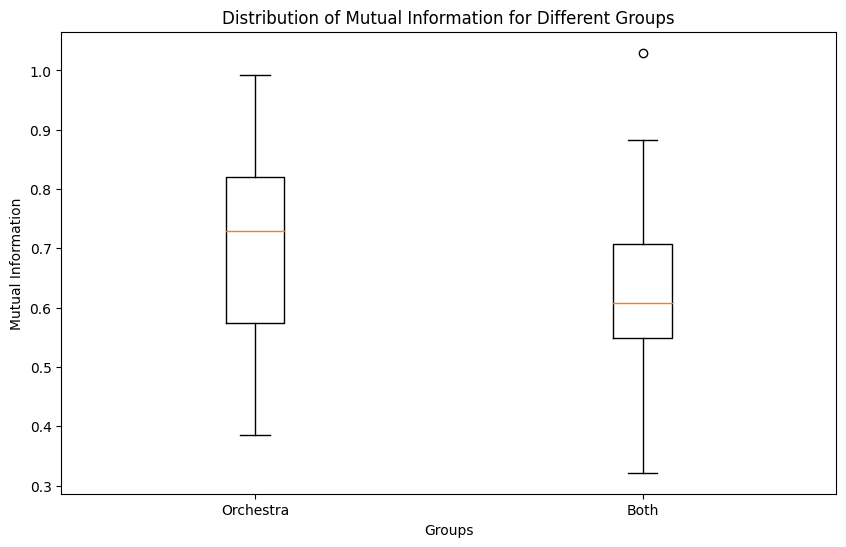

In [ ]:
# Patients in the orchestra group
orchestra_patients = [5123.0, 523.0, 3599.0, 5653.0, 5147.0, 542.0, 3615.0, 1054.0, 35.0, 36.0, 2090.0, 4139.0, 1068.0, 1071.0, 1588.0, 572.0, 1603.0]

# Patients in both groups
both_patients = [2817.0, 4804.0, 326.0, 5592.0, 393.0, 2477.0, 3921.0, 4594.0, 1106.0, 3731.0, 1460.0, 5268.0, 4180.0, 2739.0, 274.0, 5652.0, 443.0]

# Patients not in either group
other_patients = set(df_caract['caseid'].unique()) - set(orchestra_patients) - set(both_patients)

MI_orchestra = []
MI_both = []
MI_other = []

for caseid in orchestra_patients:
    df_paciente = df_caract[df_caract['caseid'] == caseid]
    x_ = df_paciente['eeg1_alpha_mobility'].tolist()
    y_ = df_paciente['ecg2_alpha_mobility'].tolist()
    mi = mutual_information(x_, y_)
    MI_orchestra.append(mi)

for caseid in both_patients:
    df_paciente = df_caract[df_caract['caseid'] == caseid]
    x_ = df_paciente['eeg1_alpha_mobility'].tolist()
    y_ = df_paciente['ecg2_alpha_mobility'].tolist()
    mi = mutual_information(x_, y_)
    MI_both.append(mi)

# Plotting
plt.figure(figsize=(10, 6))
plt.boxplot([MI_orchestra, MI_both], labels=['Orchestra', 'Both'])
plt.xlabel('Groups')
plt.ylabel('Mutual Information')
plt.title('Distribution of Mutual Information for Different Groups')
plt.show()


#Interdependencia no lineal

In [ ]:
from scipy.spatial.distance import cdist

#def calculate_nonlinear_interdependence(X, Y, m=8, tau=2, k=10, T):
def calculate_nonlinear_interdependence(X, Y, m=10, tau=29, k=10, T=20):
    # Reconstrucción de las series temporales en el espacio de estados
    def reconstruct_vectors(series):
        N = len(series)
        return np.array([series[i:(i + m * tau):tau] for i in range(N - (m - 1) * tau)])

    # Cálculo del radio cuadrado promedio de los vectores reconstruidos
    def average_squared_radius(reconstructed_vectors):
        return np.mean(np.sum(reconstructed_vectors ** 2, axis=1))

    # Cálculo de la distancia euclidiana cuadrada promedio condicionada a Y hacia sus k vecinos
    def mean_squared_distance_to_neighbours(X_reconstructed, Y_reconstructed):
        distances = cdist(Y_reconstructed, X_reconstructed, metric='sqeuclidean')
        sorted_distances = np.sort(distances, axis=1)[:, :k]
        return np.mean(sorted_distances, axis=1)

    # Reconstrucción de las series temporales en el espacio de estados
    X_reconstructed = reconstruct_vectors(X)
    Y_reconstructed = reconstruct_vectors(Y)

    # Cálculo de los radios cuadrados promedios
    Rn_X = average_squared_radius(X_reconstructed)
    Rn_Y = average_squared_radius(Y_reconstructed)

    # Cálculo de la distancia euclidiana cuadrada promedio condicionada a Y hacia sus k vecinos
    Rn_k_XY = mean_squared_distance_to_neighbours(X_reconstructed, Y_reconstructed)

    # Cálculo del índice N
    N = len(X)
    N_XY = (1/N) * sum((Rn_X -Rn_k_XY)/Rn_X)
    return N_XY

# Ejemplo de uso


In [ ]:
import numpy as np
from scipy.spatial.distance import cdist

def calculate_nonlinear_interdependence(X, Y, m=8, tau=2, k=10, T=20):
    # Normalización de las series temporales
    def normalize(series):
        return (series - np.mean(series)) / np.std(series)

    # Reconstrucción de las series temporales en el espacio de estados
    def reconstruct_vectors(series):
        N = len(series)
        return np.array([series[i:(i + m * tau):tau] for i in range(N - (m - 1) * tau)])

    # Cálculo del radio cuadrado promedio de los vectores reconstruidos
    def average_squared_radius(reconstructed_vectors):
        return np.mean(np.sum(reconstructed_vectors ** 2, axis=1))

    # Cálculo de la distancia euclidiana cuadrada promedio condicionada a Y hacia sus k vecinos
    def mean_squared_distance_to_neighbours(X_reconstructed, Y_reconstructed):
        distances = cdist(Y_reconstructed, X_reconstructed, metric='sqeuclidean')
        sorted_distances = np.sort(distances, axis=1)[:, :k]
        return np.mean(sorted_distances, axis=1)

    # Normalización de las series temporales
    X = normalize(X)
    Y = normalize(Y)

    # Reconstrucción de las series temporales en el espacio de estados
    X_reconstructed = reconstruct_vectors(X)
    Y_reconstructed = reconstruct_vectors(Y)

    # Verificación de la longitud de los vectores reconstruidos
    if len(X_reconstructed) == 0 or len(Y_reconstructed) == 0:
        raise ValueError("La longitud de los vectores reconstruidos es 0. Verifique los parámetros m y tau.")

    # Cálculo de los radios cuadrados promedios
    Rn_X = average_squared_radius(X_reconstructed)
    Rn_Y = average_squared_radius(Y_reconstructed)

    # Cálculo de la distancia euclidiana cuadrada promedio condicionada a Y hacia sus k vecinos
    Rn_k_XY = mean_squared_distance_to_neighbours(X_reconstructed, Y_reconstructed)

    # Cálculo del índice N
    N = len(X)
    N_XY = (1/N) * np.sum((Rn_X - Rn_k_XY) / Rn_X)

    return N_XY



In [ ]:
def inter_tacograma(nn, fs):
    interpolador = interp1d(np.arange(len(nn)), nn, kind='cubic')
    nuevo_tamano = fs*60
    tacograma_remuestreado = interpolador(np.linspace(0, len(nn)-1, nuevo_tamano))
    return tacograma_remuestreado

In [ ]:
seg = 20
estado = df['Estado'][seg]
eeg_signal = df['EEG1'][seg]
ecg_signal = df['ECG'][seg]
hrv = df['HRV'][seg]
hrv_inter = inter_tacograma(hrv, 250)


In [ ]:
N_XY = calculate_nonlinear_interdependence(eeg_signal, hrv_inter)
print("Índice de interdependencia no lineal (N(X|Y)): ", N_XY)
print(estado)

Índice de interdependencia no lineal (N(X|Y)):  0.980298610338726
2


In [ ]:
N_YX = calculate_nonlinear_interdependence(ecg_signal, hrv_inter)
print("Índice de interdependencia no lineal (N(Y|X)): ", N_YX)

Índice de interdependencia no lineal (N(Y|X)):  0.8850032171078136


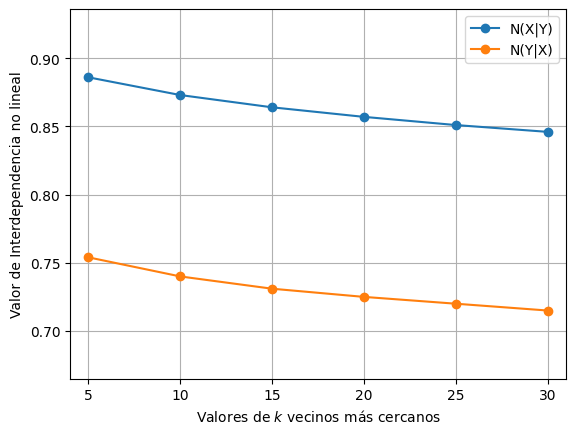

In [ ]:
#m = [4,8,12,16,20,24]
#n_xy = [0.909, 0.873, 0.812, 0.753, 0.702, 0.663]
#n_yx = [0.830, 0.740, 0.658, 0.596, 0.549, 0.508]

#m = [2,4,6,8,10,12, 14]
#n_xy = [0.873, 0.759, 0.681, 0.647, 0.642, 0.657,0.656]
#n_yx = [0.740, 0.602, 0.524, 0.470, 0.455, 0.475,0.482]

m = [5,10,15,20,25,30]
n_xy = [0.886, 0.873, 0.864, 0.857, 0.851, 0.846]
n_yx = [0.754, 0.740, 0.731, 0.725, 0.720, 0.715]

# Crear la figura y los ejes
fig, ax = plt.subplots()

tao = '\u03C4'
# Graficar los datos
ax.plot(m, n_xy, marker='o', label='N(X|Y)')
ax.plot(m, n_yx, marker='o', label='N(Y|X)')

# Etiquetas de los ejes
ax.set_xlabel(r'Valores de $k$ vecinos más cercanos')
#ax.set_xlabel('Dimensión de incrustación')
#ax.set_xlabel(f'Valores de {tao}')
ax.set_ylabel('Valor de Interdependencia no lineal')

ax.set_xlim(min(m) - 1, max(m) + 1)
ax.set_ylim(min(min(n_xy), min(n_yx)) - 0.05, max(max(n_xy), max(n_yx)) + 0.05)
# Título de la gráfica
#ax.set_title('Gráfica de m vs n_xy y n_yx')
ax.set_xticks(m)
# Mostrar la leyenda
ax.legend()
ax.grid()
# Mostrar la gráfica
plt.show()

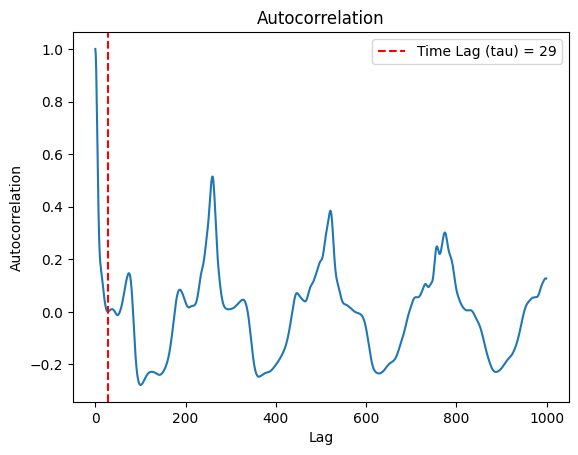

Selected Time Lag (tau) = 29


In [ ]:
def autocorrelation(x, lag):
    n = len(x)
    mean_x = np.mean(x)
    autocorr = np.correlate(x - mean_x, x - mean_x, mode='full')[n-1:] / np.var(x) / n
    return autocorr[:lag]

# Datos de ejemplo (reemplaza esto con tus datos de EEG o ECG)

seg = 2
estado = df['Estado'][seg]
eeg_signal = df['eeg1_alpha'][seg]
ecg_signal = df['ECG'][seg]

data = ecg_signal

# Definir el máximo retraso (max lag)
max_lag = 1000  # Puedes ajustar este valor según tus necesidades

# Calcular la autocorrelación hasta el max lag
autocorr = autocorrelation(data, max_lag)

# Encuentra el primer mínimo local
tau = np.where((autocorr[1:] - autocorr[:-1]) > 0)[0][0] + 1

# Visualización
plt.plot(autocorr)
plt.axvline(tau, color='r', linestyle='--', label=f'Time Lag (tau) = {tau}')
plt.legend()
plt.title('Autocorrelation')
plt.xlabel('Lag')
plt.ylabel('Autocorrelation')
plt.show()

print(f'Selected Time Lag (tau) = {tau}')


In [ ]:
!pip install nolds

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks

def mutual_information(x, max_lag):
    mi = np.zeros(max_lag)
    for lag in range(1, max_lag + 1):
        x1 = x[:-lag]
        x2 = x[lag:]
        mi[lag - 1] = np.corrcoef(x1, x2)[0, 1]
    return mi

def false_nearest_neighbors(data, max_dim, tau, Rtol=10, Atol=2):
    N = len(data)
    fnn = np.zeros(max_dim)

    for m in range(1, max_dim + 1):
        count = 0
        false_count = 0

        for i in range(N - (m + 1) * tau):
            current_vector = data[i:i + m * tau:tau]
            next_vector = data[i + tau:i + (m + 1) * tau:tau]
            dist = np.linalg.norm(current_vector - next_vector)

            nearest_dist = float('inf')
            nearest_idx = -1
            for j in range(N - (m + 1) * tau):
                if i == j:
                    continue
                candidate_vector = data[j:j + m * tau:tau]
                candidate_dist = np.linalg.norm(current_vector - candidate_vector)
                if candidate_dist < nearest_dist:
                    nearest_dist = candidate_dist
                    nearest_idx = j

            if nearest_idx == -1:
                continue

            nearest_next_vector = data[nearest_idx + tau:nearest_idx + (m + 1) * tau:tau]
            dist_next = np.linalg.norm(data[i + m * tau] - data[nearest_idx + m * tau])

            if nearest_dist == 0:
                continue

            if (dist_next / nearest_dist) > Rtol or dist_next > Atol:
                false_count += 1
            count += 1

        fnn[m - 1] = false_count / count if count != 0 else 0

    return fnn

# Datos de ejemplo (reemplaza esto con tus datos de EEG o ECG)
data = np.random.randn(15000)

# Selección de tiempo de retraso (tau)
max_lag = 1000
mi = mutual_information(data, max_lag)
peaks, _ = find_peaks(-mi)
tau = peaks[0] if peaks.size > 0 else np.argmax(mi)

if tau == 0:
    raise ValueError("El valor de tau calculado es 0, lo que no es válido. Ajusta la selección de tau.")

plt.figure(figsize=(12, 6))
plt.subplot(2, 1, 1)
plt.plot(mi)
plt.axvline(tau, color='r', linestyle='--', label=f'Time Lag (tau) = {tau}')
plt.legend()
plt.title('Mutual Information')

# Selección de la dimensión de incrustación (m)
max_dim = 20  # Máxima dimensión de incrustación a considerar
fnn = false_nearest_neighbors(data, max_dim, tau)

# Encontrar la primera dimensión con falsos vecinos cercanos por debajo de un umbral
threshold = 0.01
m = np.where(fnn < threshold)[0][0] + 1

plt.subplot(2, 1, 2)
plt.plot(range(1, max_dim + 1), fnn, marker='o')
plt.axhline(threshold, color='r', linestyle='--', label=f'Threshold = {threshold}')
plt.axvline(m, color='g', linestyle='--', label=f'Embedding Dimension (m) = {m}')
plt.legend()
plt.title('False Nearest Neighbors')
plt.xlabel('Embedding Dimension')
plt.ylabel('False Nearest Neighbors Ratio')
plt.show()

print(f'Selected Time Lag (tau) = {tau}')
print(f'Embedding Dimension (m) = {m}')


#Causalidad

In [ ]:
seg = 150
eeg_signal = df['EEG1'][seg]
ecg_signal = df['EEG2'][seg]
# Calcula la causalidad de Granger entre las señales
granger_test_result = grangercausalitytests(np.column_stack((eeg_signal, ecg_signal)), maxlag=5)

# Imprime los resultados
print(granger_test_result)


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=54.5637 , p=0.0000  , df_denom=14996, df_num=1
ssr based chi2 test:   chi2=54.5746 , p=0.0000  , df=1
likelihood ratio test: chi2=54.4756 , p=0.0000  , df=1
parameter F test:         F=54.5637 , p=0.0000  , df_denom=14996, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=12.7293 , p=0.0000  , df_denom=14993, df_num=2
ssr based chi2 test:   chi2=25.4671 , p=0.0000  , df=2
likelihood ratio test: chi2=25.4455 , p=0.0000  , df=2
parameter F test:         F=12.7293 , p=0.0000  , df_denom=14993, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=8.9149  , p=0.0000  , df_denom=14990, df_num=3
ssr based chi2 test:   chi2=26.7573 , p=0.0000  , df=3
likelihood ratio test: chi2=26.7335 , p=0.0000  , df=3
parameter F test:         F=8.9149  , p=0.0000  , df_denom=14990, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=7.4557  

#Sincronización de fase

In [ ]:
from scipy.signal import hilbert

def phase_synchronization(eeg_signal, ecg_signal):

    # Calcula las señales analíticas
    eeg_analytic_signal = hilbert(eeg_signal)
    ecg_analytic_signal = hilbert(ecg_signal)

    # Calcula la fase de las señales analíticas
    eeg_phase = np.angle(eeg_analytic_signal)
    ecg_phase = np.angle(ecg_analytic_signal)

    # Calcula la diferencia de fase
    phase_diff = np.abs(np.mean(np.exp(1j * (eeg_phase - ecg_phase))))

    return phase_diff



In [ ]:
seg =0
estado = df['Estado'][seg]
eeg_signal = df['eeg2_alpha'][seg]
ecg_signal = df['ecg2_alpha'][seg]

phase_sync = phase_synchronization(eeg_signal, ecg_signal)
print("Sincronización de fase:", phase_sync)

Sincronización de fase: 0.05038706149256581


In [ ]:
seg =100
estado = df['Estado'][seg]
eeg_signal = df['EEG1'][seg]
ecg_signal = df['ECG'][seg]

phase_sync = phase_synchronization(eeg_signal, ecg_signal)
print("Sincronización de fase:", phase_sync)

Sincronización de fase: 0.09024508049776821


In [ ]:
seg = 100
eeg_signal = df['EEG1'][seg]
ecg_signal = df['ECG'][seg]
eeg_analytic_signal = hilbert(eeg_signal)
ecg_analytic_signal = hilbert(ecg_signal)

# Calcula la fase de las señales analíticas
eeg_phase = np.angle(eeg_analytic_signal)
ecg_phase = np.angle(ecg_analytic_signal)

# Calcula la diferencia de fase
phase_diff = np.abs(np.mean(np.exp(1j * (eeg_phase - ecg_phase))))

(0.0, 4000.0)

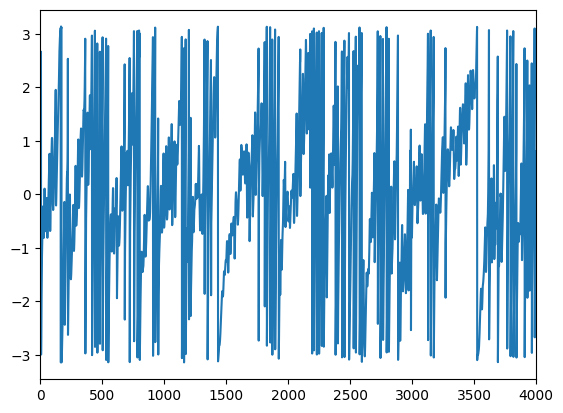

In [ ]:
plt.plot(eeg_phase)
plt.xlim(0,4000)

(0.0, 1000.0)

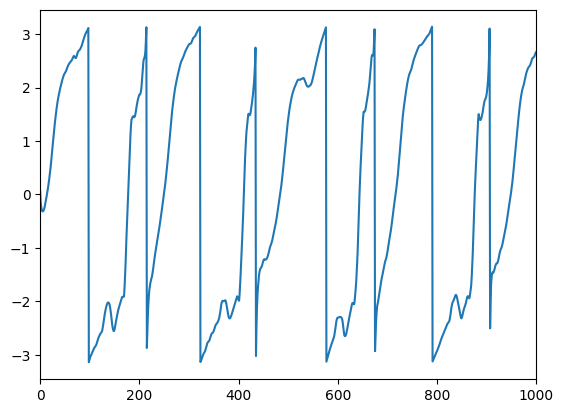

In [ ]:
plt.plot(ecg_phase)
plt.xlim(0,1000)

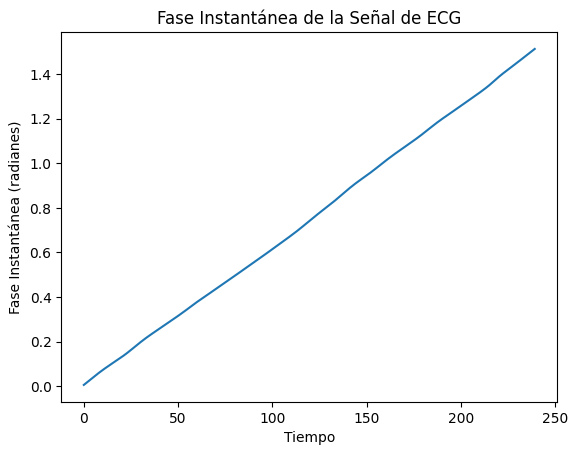

In [ ]:
rr_intervals = df['HRV'][seg]
instantaneous_phase = np.cumsum(2 * np.pi / rr_intervals)

# Plotear la fase instantánea
plt.plot(instantaneous_phase)
plt.xlabel('Tiempo')
plt.ylabel('Fase Instantánea (radianes)')
plt.title('Fase Instantánea de la Señal de ECG')
plt.show()

In [ ]:
instantaneous_phase

array([0.0067128 , 0.01355518, 0.02046818, 0.02739682, 0.03429304,
       0.04111757, 0.04784088, 0.05444309, 0.06091334, 0.06724866,
       0.07345194, 0.07953059, 0.08549579, 0.09136198, 0.09714625,
       0.10286816, 0.10854972, 0.11421572, 0.11989546, 0.12562476,
       0.1314477 , 0.13741902, 0.14359201, 0.14999621, 0.15662817,
       0.16344157, 0.17035877, 0.17730655, 0.18422508, 0.19107105,
       0.1978149 , 0.20443174, 0.21090019, 0.21720263, 0.22332958,
       0.22929369, 0.23512869, 0.24088622, 0.24662936, 0.25240273,
       0.25822369, 0.26408134, 0.26993925, 0.27576556, 0.28154714,
       0.28728898, 0.29301227, 0.29874249, 0.30450255, 0.3103131 ,
       0.31619282, 0.3221567 , 0.32821427, 0.33436888, 0.34061678,
       0.34694285, 0.35331559, 0.3596867 , 0.36599313, 0.37217841,
       0.37822188, 0.38413654, 0.38996367, 0.39575713, 0.40155424,
       0.4073733 , 0.41321376, 0.41906085, 0.42490241, 0.43073232,
       0.43655058, 0.44236238, 0.44817453, 0.45399447, 0.45983

#Indice de dirreccionalidad

In [ ]:
import numpy as np

def directional_index(eeg_signal, ecg_signal):

    # Calcula la varianza de la señal ECG
    ecg_variance = np.var(ecg_signal)

    # Calcula la covarianza entre las señales
    cross_covariance = np.cov(eeg_signal, ecg_signal)[0][1]

    # Calcula el Índice de Direccionalidad (DI)
    directional_index = (cross_covariance - ecg_variance) / (cross_covariance + ecg_variance)

    return directional_index


In [ ]:
seg = 180
estado = df['Estado'][seg]
eeg_signal = df['EEG1'][seg]
ecg_signal = df['ECG'][seg]

phase_sync = directional_index(eeg_signal, ecg_signal)
print("Sincronización de fase:", phase_sync)

Sincronización de fase: 0.5162568516531605
